In [1]:
%load_ext autoreload
%autoreload 2
import glob
import os
import re
import subprocess
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from joblib import Parallel, delayed
from scipy.signal import find_peaks, savgol_filter
from scipy.stats import circmean
from sklearn.preprocessing import StandardScaler
from tqdm.contrib.concurrent import process_map
from tqdm.notebook import tqdm
import pathlib
from extract_stimulus_heading_for_camera import (
    process_braidz_file,
    create_interpolation_function,
)
from natsort import natsorted
from datetime import datetime

In [2]:
# Files for first strain Canton-s
'''
canton_s = [
    "20250501_183152.braidz",
    "20250429_193010.braidz",
    "20250411_175919.braidz",
    "20250111_151946.braidz",
    "20241126_171308.braidz",
    "20250110_142709.braidz",
    "20241130_161634.braidz",
    "20250422_171703.braidz",
    "20250102_152013.braidz",
    "20241121_151406.braidz",
    "20250421_174810.braidz",
    "20250425_195715.braidz",
    "20250410_120718.braidz",
    "20250428_171938.braidz",
]
'''
canton_s = ["20250501_183152.braidz",
    "202504_23,24_160499.braidz",
    "20250429_193010.braidz",
    "20250411_175919.braidz",
    "20250111_151946.braidz",
    "20241126_171308.braidz",
    "20250110_142709.braidz",
    "20241130_161634.braidz",
    "20250422_171703.braidz",
    "20250102_152013.braidz",
    "20241121_151406.braidz",
    "20250421_174810.braidz",
    "20250425_195715.braidz",
    "20250410_120718.braidz",
    "20250428_171938.braidz"
]
'''
# Files for second strain Native
native = [
    "20250410_120718.braidz",
    "20250501_152448.braidz",
    "20250501_183152.braidz",
    "20250430_155345.braidz",
    "20241129_144233.braidz",
    "20250106_153631.braidz",
    "20241127_152044.braidz",
    "20241116_154109.braidz",
    "20250108_160315.braidz",
    "20241125_132912.braidz",
    "20241114_173118.braidz",
    "20250427_170153.braidz",
    "20241112_124059.braidz",
]
'''
native = [
    "20250410_120718.braidz",
    "20250501_152448.braidz",
    "20250430_155345.braidz",
    "20241129_144233.braidz",
    "20250106_153631.braidz",
    "20241127_152044.braidz",
    "20241116_154109.braidz",
    "20250108_160315.braidz",
    "20241125_132912.braidz",
    "20241114_173118.braidz",
    "20250427_170153.braidz",
    "20241112_124059.braidz"
]

In [3]:
SCREEN2HEADING_DATA = """
screen,heading
0,2.3513283485530456
80,1.2179812647799937
160,0.5031545295746856
240,-0.3078141744904855
320,-0.8746949393526915
400,-1.5019022477483523
480,-2.185375561680841
560,-3.0123437340031307
640,2.3513283485530456
"""
get_heading_func = create_interpolation_function()

In [4]:
# Setup paths
#braidz_path = "/gpfs/soma_fs/nfc/nfc3008/Experiments/"
braidz_path= "/gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/"
braidz_files = glob.glob(os.path.join(braidz_path, "*.braidz"))

#slp_path = "/gpfs/soma_fs/home/buchsbaum/sleap_projects/highspeed/predictions/"
slp_path = "/gpfs/soma_fs/home/kotra/slp_data/"
slp_folders = glob.glob(
    os.path.join(
        slp_path,
        "*",
    )
)
slp_folders = natsorted(slp_folders)
#output_path = "/gpfs/soma_fs/home/buchsbaum/src/sleap_video_analysis/output"
output_path = "/gpfs/soma_fs/home/kotra/sleap_video_analysis_f/output"

In [5]:
# Loop over slp files and find the corresponding braidz files
for slp_folder in tqdm(slp_folders):
    filename = pathlib.Path(slp_folder).stem
    date = filename.split("_")[0]

    braidz_file_to_search = os.path.join(braidz_path, filename + ".braidz")

    # check if braidz file exists in `braidz_files` list
    braidz_file = [f for f in braidz_files if filename in f]
    braidz_file = braidz_file[0] if braidz_file else None
    if braidz_file is None:
        print(f"No braidz file found for {filename}, trying to search for another file with date {date}")

        # if braidz file not found, search for braidz files with the same date but a different time
        braidz_file = [f for f in braidz_files if date in f]
        braidz_file = braidz_file[0] if braidz_file else None

        if braidz_file is None:
            print(f"No braidz file found for {filename}, skipping")
            continue

    # make sure `braidz_file` exists
    if not os.path.exists(braidz_file):
        print(f"Braidz file {braidz_file} does not exist, skipping")
        continue

    # extract stimulus information from braidz file
    process_braidz_file(braidz_file, "data", get_heading_func)

  0%|          | 0/34 [00:00<?, ?it/s]

Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241112_124059.braidz to data/20241112_124059.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241114_173118.braidz to data/20241114_173118.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241116_154109.braidz to data/20241116_154109.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241121_151406.braidz to data/20241121_151406.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241125_132912.braidz to data/20241125_132912.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241126_171308.braidz to data/20241126_171308.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241127_152044.braidz to data/20241127_152044.csv
Interpolated /gpfs/soma_fs/home/kotra/trajectory_analysis/braidz_files/20241129_144233.braidz to data/20241129_144233.csv
Interpolated /gpfs/soma_

# Helper functions

In [6]:
def calculate_heading_difference(a1, a2):
    # Calculate the angular difference considering the circular nature
    diff = a1 - a2

    # Normalize to [-π, π] range
    return np.arctan2(np.sin(diff), np.cos(diff))


def sg_smooth(array, window_length=51, polyorder=3, **kwargs):
    return savgol_filter(
        array, window_length=window_length, polyorder=polyorder, **kwargs
    )


def unwrap_with_nan(array):
    array[~np.isnan(array)] = np.unwrap(array[~np.isnan(array)])
    return array


def detect_tracking_gaps(df, min_tracked_frames=10, min_gap_size=20):
    """
    Detects if there are multiple tracking sections separated by NaN gaps in the data.

    Parameters:
        df (pd.DataFrame): The dataframe with tracking data (complete_df)
        min_tracked_frames (int): Minimum consecutive frames to consider a valid tracking section
        min_gap_size (int): Minimum size of NaN gap to alert about

    Returns:
        bool: True if multiple tracking sections with gaps are detected
    """
    # Create a mask for rows where all tracking points are valid
    valid_mask = (
        ~pd.isna(df["head.x"])
        & ~pd.isna(df["head.y"])
        & ~pd.isna(df["abdomen.x"])
        & ~pd.isna(df["abdomen.y"])
    )

    # Convert mask to integers (1 for valid, 0 for NaN)
    valid_series = valid_mask.astype(int)

    # Detect changes in the mask (0->1 or 1->0)
    # This creates a series where 1 indicates the start or end of a tracking section
    changes = valid_series.diff().abs()

    # Get indices where changes occur
    change_indices = np.where(changes == 1)[0]

    # If less than 2 changes, there's only one section or no valid sections
    if len(change_indices) < 2:
        return False

    # Calculate segments
    segments = []

    # If the first frame is valid, the first change is the end of a segment
    start_idx = 0 if valid_series.iloc[0] == 1 else change_indices[0]

    for i in range(1 if valid_series.iloc[0] == 1 else 2, len(change_indices), 2):
        if i >= len(change_indices):
            # If we have an odd number of changes and started with a valid segment
            end_idx = len(valid_series) - 1
        else:
            end_idx = change_indices[i] - 1

        # Only include segments that are long enough
        segment_length = end_idx - start_idx + 1
        if segment_length >= min_tracked_frames:
            segments.append((start_idx, end_idx, segment_length))

        # Set up for next segment if there are more changes
        if i + 1 < len(change_indices):
            start_idx = change_indices[i + 1]

    # If we have only one valid segment, no need to alert
    if len(segments) <= 1:
        return False

    # Check gaps between segments
    for i in range(len(segments) - 1):
        current_end = segments[i][1]
        next_start = segments[i + 1][0]
        gap_size = next_start - current_end - 1

        if gap_size >= min_gap_size:
            # print(f"ALERT: Multiple tracking sections detected!")
            # print(f"  Section 1: Frames {segments[i][0]}-{segments[i][1]} ({segments[i][2]} frames)")
            # print(f"  Gap: {gap_size} frames with NaNs")
            # print(f"  Section 2: Frames {segments[i+1][0]}-{segments[i+1][1]} ({segments[i+1][2]} frames)")
            return True

    return False


def savgol_filter_with_nans(y, window_length, polyorder, **kwargs):
    """
    Apply savgol_filter to an array that contains NaNs.
    The filter is only applied to contiguous segments of non-NaN values.

    Parameters:
    -----------
    y : array_like
        The data to be filtered
    window_length : int
        The length of the filter window (must be odd)
    polyorder : int
        The order of the polynomial used to fit the samples
    **kwargs : dict
        Additional arguments to pass to savgol_filter

    Returns:
    --------
    y_filtered : ndarray
        The filtered data with NaNs preserved in their original locations
    """
    # Create a copy of the input array to avoid modifying the original
    y_filtered = np.copy(y)

    # Find indices of non-NaN values
    valid_indices = ~np.isnan(y)

    if not np.any(valid_indices):
        return y_filtered  # Return original if all values are NaN

    # Find contiguous segments of valid data
    diff_indices = np.diff(np.concatenate(([0], valid_indices.astype(int), [0])))
    start_indices = np.where(diff_indices == 1)[0]
    end_indices = np.where(diff_indices == -1)[0]
    segments = zip(start_indices, end_indices)

    # Apply savgol_filter to each segment separately
    for start, end in segments:
        # Only apply filter if the segment is long enough
        if end - start >= window_length:
            y_filtered[start:end] = savgol_filter(
                y[start:end], window_length, polyorder, **kwargs
            )
        # Leave shorter segments unfiltered

    return y_filtered

In [7]:
def process_data(stim_csvs_folder, pre_range=[0, 400], post_range=[400, 750]):
    """
    This function accepts a folder with all the csv files that contain the stimulus data as
    extracted from the braid recording.
    Then, for each file, it finds the correct folder with the converted slp files, and
    inside that folder finds the correct file that matches each row (obj_id + frame) in the stim csv file.

    It then loads the data from that file, and calculates the heading difference between pre and post
    stimulus data, as well as the heading difference between pre stimulus and the stimulus heading.
    The results are returned as a pandas DataFrame.

    Parameters:
        stim_csvs_folder (str): The folder containing the stimulus CSV files.
        pre_range (list): The range of frames to consider for pre-stimulus data.
        post_range (list): The range of frames to consider for post-stimulus data.

    Returns:
        pd.DataFrame: A DataFrame containing the processed data with heading differences.
    """
    # Create an empty list to collect all the data
    all_data = []

    # get all csv files in the stim_csvs_folder (these are the stim files)
    stim_csvs = sorted(glob.glob(os.path.join(stim_csvs_folder, "*.csv")))

    # define pattern recognition for filenames
    pattern = r"obj_id_(\d+)_frame_(\d+)"

    # loop over all files
    for stim_csv in stim_csvs:
        #date = datetime.strptime(os.path.basename(stim_csv), "%Y%m%d_%H%M%S.csv").date()
        '''
        # check if date is before 1st of April 2025
        if date < datetime(2025, 4, 1).date():
            print(f"Skipping file {stim_csv} because it's before April 1st, 2025")
            continue
        '''
        print(f"==== Processing {stim_csv} ====")
        stim_df = pd.read_csv(stim_csv)  # read the csv

        # now get the correct folder for the stim file
        slp2csv_folder = os.path.join(
            stim_csvs_folder,
            os.path.join(
                os.path.basename(os.path.normpath(stim_csv)).replace(".csv", "")
            ),
        )

        # and get all the files from that folder
        slp2csv_files = sorted(glob.glob(os.path.join(slp2csv_folder, "*.csv")))
        if len(slp2csv_files) == 0:
            print(f"No slp2csv files found in {slp2csv_folder}, skipping")
            continue

        # loop over the rows of each stim file
        for idx, row in stim_df.iterrows():
            # extract data for each stim row
            stim_obj_id = int(row["obj_id"])
            stim_frame = int(row["frame"])
            stim_heading = float(row["stim_heading"])

            # Find the matching csv file
            matching_file = None
            for file in slp2csv_files:
                match = re.search(pattern, file)
                if match:
                    file_obj_id = int(match.group(1))
                    file_frame = int(match.group(2))

                    if file_obj_id == stim_obj_id and file_frame == stim_frame:
                        matching_file = file
                        break

            # if no matching file was found, skip
            if matching_file is None:
                continue

            # Load the matching file
            data_df = pd.read_csv(matching_file)

            # Check if the original data has too few tracked frames
            if len(data_df) < 51:
                # print(f"Skipping file with insufficient data: {matching_file}")
                continue

            # Create an empty DataFrame with the same structure as data_df
            complete_df = pd.DataFrame(columns=data_df.columns)

            # Set dtypes to match the original dataframe
            for col in data_df.columns:
                complete_df[col] = complete_df[col].astype(data_df[col].dtype)

            # Fill the frame_idx column with all possible frames (0-749)
            complete_df["frame_idx"] = np.array(range(750))

            # Set the index to frame_idx for easier merging
            complete_df = complete_df.set_index("frame_idx")
            data_df_indexed = data_df.set_index("frame_idx")

            # Update the complete_df with values from the original data_df
            complete_df.update(data_df_indexed)

            # Reset index to make frame_idx a column again
            complete_df = complete_df.reset_index()

             # Example usage in your code:
            if detect_tracking_gaps(
                complete_df, min_tracked_frames=10, min_gap_size=20
            ):
                has_tracking_gaps = True

            # Now interpolate to fill the gaps in tracking data
            data_df_interp = complete_df.interpolate(
                method="linear", limit_direction="both", limit=25
            )

            # extract all data and apply smoothing
            frames = data_df_interp["frame_idx"].to_numpy()
            head_x = savgol_filter_with_nans(
                data_df_interp["head.x"].to_numpy(), window_length=51, polyorder=3
            )
            head_y = savgol_filter_with_nans(
                data_df_interp["head.y"].to_numpy(), window_length=51, polyorder=3
            )
            abdomen_x = savgol_filter_with_nans(
                data_df_interp["abdomen.x"].to_numpy(), window_length=51, polyorder=3
            )
            abdomen_y = savgol_filter_with_nans(
                data_df_interp["abdomen.y"].to_numpy(), window_length=51, polyorder=3
            )

            # head_x = sg_smooth(data_df_interp["head.x"].to_numpy())
            # head_y = sg_smooth(data_df_interp["head.y"].to_numpy())
            # abdomen_x = sg_smooth(data_df_interp["abdomen.x"].to_numpy())
            # abdomen_y = sg_smooth(data_df_interp["abdomen.y"].to_numpy())

            # extract all frames in pre and post stimulus ranges
            pre_indices = np.where((frames >= pre_range[0]) & (frames < pre_range[1]))[
                0
            ]
            post_indices = np.where(
                (frames >= post_range[0]) & (frames < post_range[1])
            )[0]

            # Count frames with valid (non-NaN) tracking data in pre-range
            pre_valid_mask = (
                ~np.isnan(head_x[pre_indices])
                & ~np.isnan(head_y[pre_indices])
                & ~np.isnan(abdomen_x[pre_indices])
                & ~np.isnan(abdomen_y[pre_indices])
            )
            pre_valid_count = np.sum(pre_valid_mask)

            # Count frames with valid (non-NaN) tracking data in post-range
            post_valid_mask = (
                ~np.isnan(head_x[post_indices])
                & ~np.isnan(head_y[post_indices])
                & ~np.isnan(abdomen_x[post_indices])
                & ~np.isnan(abdomen_y[post_indices])
            )
            post_valid_count = np.sum(post_valid_mask)

            # Skip if not enough valid frames in these ranges
            if pre_valid_count < 10 or post_valid_count < 10:
                continue

            # Keep only valid indices
            pre_indices = pre_indices[pre_valid_mask]
            post_indices = post_indices[post_valid_mask]

            # extract pre-stimulus coordinates
            head_x_pre = head_x[pre_indices]
            head_y_pre = head_y[pre_indices]
            abdomen_x_pre = abdomen_x[pre_indices]
            abdomen_y_pre = abdomen_y[pre_indices]

            # extract post-stimulus coordinates
            head_x_post = head_x[post_indices]
            head_y_post = head_y[post_indices]
            abdomen_x_post = abdomen_x[post_indices]
            abdomen_y_post = abdomen_y[post_indices]

            # calculate heading for each frame (angle of vector from abdomen to head)
            pre_heading = np.arctan2(
                head_y_pre - abdomen_y_pre, head_x_pre - abdomen_x_pre
            )
            post_heading = np.arctan2(
                head_y_post - abdomen_y_post, head_x_post - abdomen_x_post
            )

            # calculate circular mean of headings (accounts for circular nature of angle data)
            pre_heading_mean = circmean(pre_heading, high=np.pi, low=-np.pi)
            post_heading_mean = circmean(post_heading, high=np.pi, low=-np.pi)

            # calculate heading differences
            try:
                # Calculate the difference between post-stimulus and pre-stimulus headings
                prepost_heading_difference = calculate_heading_difference(
                    post_heading_mean, pre_heading_mean
                )

                # Calculate the difference between stimulus heading and pre-stimulus heading
                prestim_heading_difference = calculate_heading_difference(
                    stim_heading, pre_heading_mean
                )

                # Calculate the difference between stimulus heading and post-stimulus heading
                poststim_heading_difference = calculate_heading_difference(
                    stim_heading, post_heading_mean
                )

                # Determine if the fly turned toward or away from the stimulus
                # Get sign of stimulus position relative to fly
                stimulus_direction = np.sign(prestim_heading_difference)

                # Get sign of the turn
                turn_direction = np.sign(prepost_heading_difference)

                # If stimulus_direction and turn_direction have opposite signs,
                # the fly turned away from the stimulus
                turned_away = stimulus_direction * turn_direction < 0
                # Extract the base filename without any extension
                basename = os.path.splitext(os.path.basename(stim_csv))[0]

                # Create sets of basenames without extensions (more efficient for lookups)
                native_basenames = {os.path.splitext(filename)[0] for filename in native}
                canton_s_basenames = {os.path.splitext(filename)[0] for filename in canton_s}
                
                row_data = row.to_dict()  # Convert the row to a dictionary
                # Determine the group
                if basename in native_basenames:
                    row_data["group"] = "Native"
                elif basename in canton_s_basenames:
                    row_data["group"] = "Canton-s"
                else:
                    row_data["group"] = "Unknown"  # Handle case where it doesn't match either list
                
                row_data["obj_id"] = int(row_data["obj_id"])
                row_data["frame"] = int(row_data["frame"])
                row_data["file"] = basename
                row_data["prepost_heading_difference"] = prepost_heading_difference
                row_data["prestim_heading_difference"] = prestim_heading_difference
                row_data["poststim_heading_difference"] = poststim_heading_difference
                row_data["pre_heading"] = pre_heading_mean
                row_data["post_heading"] = post_heading_mean
                row_data["turned_away"] = turned_away
                row_data["turn_direction"] = "Away" if turned_away else "Toward"

                # Append to the all_data list
                all_data.append(row_data)
            
            except ValueError as e:
                print(f"Error calculating heading difference: {e}")
                continue
    # Create a DataFrame from all the collected data
    result_df = pd.DataFrame(all_data)

    # Now result_df contains all the data from all files with the heading differences
    print(f"Combined DataFrame has {len(result_df)} rows")
    return result_df

In [8]:
results_df = process_data(
    "/gpfs/soma_fs/home/kotra/all_data/"
)


==== Processing /gpfs/soma_fs/home/kotra/all_data/20241112_124059.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241114_173118.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241116_154109.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241121_151406.csv ====
No slp2csv files found in /gpfs/soma_fs/home/kotra/all_data/20241121_151406, skipping
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241125_132912.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241126_171308.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241127_152044.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241129_144233.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20241130_161634.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20250102_152013.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20250106_153631.csv ====
==== Processing /gpfs/soma_fs/home/kotra/all_data/20250108_160315.csv ====
==== Processin

In [9]:
# bin data by `prestim_heading_difference`
# where -45 to +45 is `front`, -45 to -135 is `left`, +45 to +135 is `right`, rest is 'back'
def bin_heading_difference(row):
    if (
        row["prestim_heading_difference"] >= -np.pi / 4
        and row["prestim_heading_difference"] <= np.pi / 4
    ):
        return "front"
    elif (
        row["prestim_heading_difference"] > np.pi / 4
        and row["prestim_heading_difference"] <= 3 * np.pi / 4
    ):
        return "right"
    elif (
        row["prestim_heading_difference"] < -np.pi / 4
        and row["prestim_heading_difference"] >= -3 * np.pi / 4
    ):
        return "left"
    else:
        return "back"


# Apply the function to create a new column
results_df["prestim_heading_bin"] = results_df.apply(
    bin_heading_difference, axis=1
)


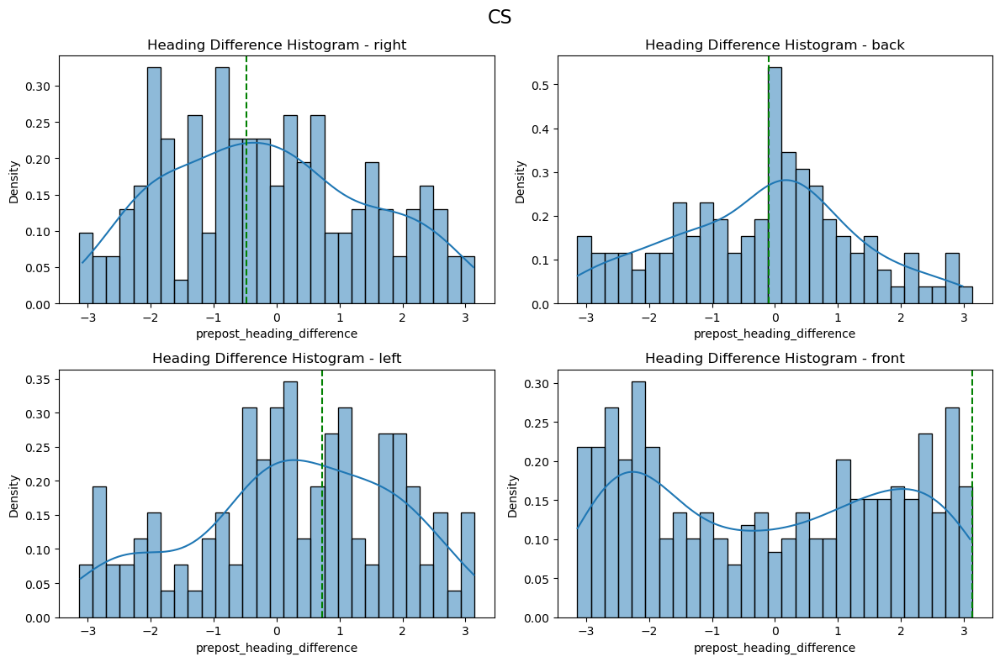

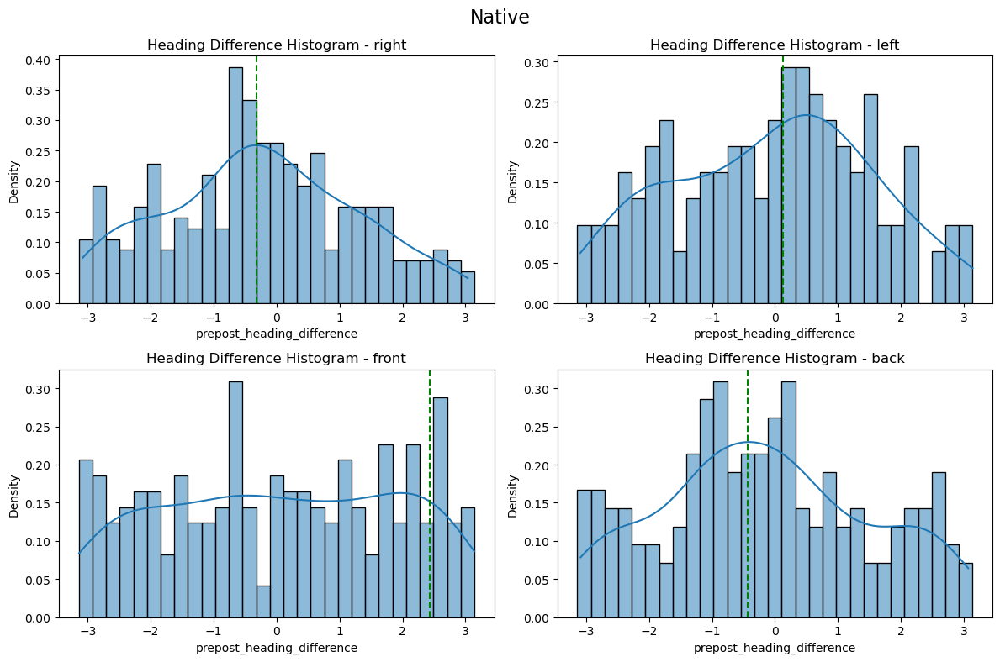

In [10]:
def plot_histogram_for_all_bins(results_df, label):
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))
    bins = results_df["prestim_heading_bin"].unique()
    for i, bin in enumerate(bins):
        ax = axs[i // 2, i % 2]
        bin_df = results_df[results_df["prestim_heading_bin"] == bin]
        sns.histplot(
            data=bin_df,
            x="prepost_heading_difference",
            bins=np.linspace(-np.pi, np.pi, 30),
            common_bins=True,
            stat="density",
            label=bin,
            ax=ax,
            common_norm=True,
            kde=True,
        )

        # add line for median and mean
        mean = circmean(bin_df["prepost_heading_difference"], high=np.pi, low=-np.pi)

        ax.axvline(mean, color="g", linestyle="--", label="Mean")
        ax.set_title(f"Heading Difference Histogram - {bin}")

    fig.suptitle(label, fontsize=16)
    plt.tight_layout()
    plt.show()


plot_histogram_for_all_bins(results_df[results_df["group"] == "Canton-s"], "CS")
plot_histogram_for_all_bins(results_df[results_df["group"] == "Native"], "Native")

# Clustering

In [11]:
def get_data_for_clustering(stim_csvs_folder, window=25, mean=False,):
    # Create a list to store all feature matrices
    all_features = []
    # Create a list to store metadata
    all_metadata = []

    # get all csv files in the stim_csvs_folder (these are the stim files)
    stim_csvs = sorted(glob.glob(os.path.join(stim_csvs_folder, "*.csv")))

    # define pattern recognition for filenames
    pattern = r"obj_id_(\d+)_frame_(\d+)"
    raw_data = {}
    # Inside your nested loops, after extracting features:
    for i, stim_csv in enumerate(stim_csvs):
        print(f"Processing file {stim_csv} ({i} out of {len(stim_csvs)})")
        # print(f"==== Processing {stim_csv} ====")
        stim_df = pd.read_csv(stim_csv)  # read the csv

        # now get the correct folder for the stim file
        slp2csv_folder = os.path.join(
            stim_csvs_folder,
            os.path.join(
                os.path.basename(os.path.normpath(stim_csv)).replace(".csv", "")
            ),
        )

        # and get all the files from that folder
        slp2csv_files = sorted(glob.glob(os.path.join(slp2csv_folder, "*.csv")))

        for j, (idx, row) in enumerate(stim_df.iterrows()):
            # extract data for each stim row
            stim_obj_id = int(row["obj_id"])
            stim_frame = int(row["frame"])
            stim_heading = float(row["stim_heading"])

            # Find the matching csv file
            matching_file = None
            for file in slp2csv_files:
                match = re.search(pattern, file)
                if match:
                    file_obj_id = int(match.group(1))
                    file_frame = int(match.group(2))

                    if file_obj_id == stim_obj_id and file_frame == stim_frame:
                        matching_file = file
                        break

            # if no matching file was found, skip
            if matching_file is None:
                continue

            # Load the matching file
            data_df = pd.read_csv(matching_file)

            # Create an empty DataFrame with the same structure as data_df
            complete_df = pd.DataFrame(columns=data_df.columns)

            # Set dtypes to match the original dataframe
            for col in data_df.columns:
                complete_df[col] = complete_df[col].astype(data_df[col].dtype)

            # Fill the frame_idx column with all possible frames (0-749)
            complete_df["frame_idx"] = list(range(750))

            # Set the index to frame_idx for easier merging
            complete_df = complete_df.set_index("frame_idx")
            data_df_indexed = data_df.set_index("frame_idx")

            # Update the complete_df with values from the original data_df
            complete_df.update(data_df_indexed)

            # Reset index to make frame_idx a column again
            complete_df = complete_df.reset_index()

            # Example usage in your code:

            # Now interpolate to fill the gaps in tracking data
            data_df_interp = complete_df.interpolate(
                method="linear", limit_direction="both", limit=25
            )

            # extract all data and apply smoothing
            frames = data_df_interp["frame_idx"].to_numpy()
            head_x = savgol_filter_with_nans(
                data_df_interp["head.x"].to_numpy(), window_length=51, polyorder=3
            )
            head_y = savgol_filter_with_nans(
                data_df_interp["head.y"].to_numpy(), window_length=51, polyorder=3
            )
            abdomen_x = savgol_filter_with_nans(
                data_df_interp["abdomen.x"].to_numpy(), window_length=51, polyorder=3
            )
            abdomen_y = savgol_filter_with_nans(
                data_df_interp["abdomen.y"].to_numpy(), window_length=51, polyorder=3
            )

            # Calculate different features
            heading = np.arctan2(head_y - abdomen_y, head_x - abdomen_x)
            heading_unwrap = unwrap_with_nan(heading)
            heading_change = savgol_filter(
                np.gradient(heading_unwrap, 1 / 500), window_length=21, polyorder=3
            )
            distance_between_head_and_abdomen = np.sqrt(
                (head_x - abdomen_x) ** 2 + (head_y - abdomen_y) ** 2
            )

            # calculate centroid based on head and abodomen coordinates
            centroid_x = (head_x + abdomen_x) / 2
            centroid_y = (head_y + abdomen_y) / 2
            centroid_velocity_x = savgol_filter_with_nans(
                np.gradient(centroid_x, 1 / 500), window_length=21, polyorder=3
            )
            centroid_velocity_y = savgol_filter_with_nans(
                np.gradient(centroid_y, 1 / 500), window_length=21, polyorder=3
            )
            centroid_velocity = np.sqrt(centroid_velocity_x**2 + centroid_velocity_y**2)
            centroid_acceleration = savgol_filter_with_nans(
                np.gradient(centroid_velocity, 1 / 500), window_length=21, polyorder=3
            )

            theta = np.arctan2(centroid_velocity_y, centroid_velocity_x)
            theta_unwrap = unwrap_with_nan(theta)
            angular_velocity = savgol_filter_with_nans(
                np.gradient(theta_unwrap, 1 / 500), window_length=21, polyorder=3
            )

            # find peaks in the angular velocity
            positive_peaks, _ = find_peaks(
                angular_velocity, height=np.deg2rad(1000), distance=50
            )
            negative_peaks, _ = find_peaks(
                -angular_velocity, height=np.deg2rad(1000), distance=50
            )
            all_peaks = np.sort(np.concatenate((positive_peaks, negative_peaks)))

            # find if there are any peaks in range
            response_peak = [peak for peak in all_peaks if 350 < peak < 450]

            # get response_peak
            if len(response_peak) == 0:
                response_peak = 390 # this is the average response time based on previous calculations
            else:
                response_peak = response_peak[0]

            # get window to extract
            if window == 1:
                indices = response_peak
            else:
                indices = range(response_peak - window, response_peak + window + 1)

            # extract the window
            heading = heading[indices]

            # ignoring nans
            if np.any(np.isnan(heading)):
                continue
            
            # extract all other parameters
            heading_change = heading_change[indices]
            distance_between_head_and_abdomen = distance_between_head_and_abdomen[
                indices
            ]
            centroid_velocity = centroid_velocity[indices]
            centroid_acceleration = centroid_acceleration[indices]
            angular_velocity = angular_velocity[indices]

            frames = frames[indices]
            x = centroid_x[indices]
            y = centroid_y[indices]

            # Extract the base filename without any extension
            basename = os.path.splitext(os.path.basename(stim_csv))[0]

            # Create sets of basenames without extensions (more efficient for lookups)
            native_basenames = {os.path.splitext(filename)[0] for filename in native}
            canton_s_basenames = {os.path.splitext(filename)[0] for filename in canton_s}
            
            # Determine the group name first
            if basename in native_basenames:
                group_name = "Native"
            elif basename in canton_s_basenames:
                group_name = "Canton-s"
            else:
                group_name = "Unknown"
            
            # save all raw data
            raw_data[os.path.basename(matching_file)] = {
                "obj_id": int(row["obj_id"]),
                "frame": int(row["frame"]),
                "stim_heading": float(row["stim_heading"]),
                "group": group_name,
                "stim_csv": os.path.basename(stim_csv),
                "slp_csv": os.path.basename(matching_file),
                "stimulus_position": stim_heading,
                "response_peak": response_peak,
                "heading": heading,
                "heading_change": heading_change,
                "distance_between_head_and_abdomen": distance_between_head_and_abdomen,
                "centroid_velocity": centroid_velocity,
                "centroid_acceleration": centroid_acceleration,
                "angular_velocity": angular_velocity,
                "x": x,
                "y": y,
                "frames": frames,
            }

            # Apply as single value or list based on window condition
            if window == 1 or mean:
                group = group_name
                file = os.path.basename(matching_file)
                
                frames = np.nanmean(frames)
                x = np.nanmean(x)
                y = np.nanmean(y)

                heading_sd = np.nanstd(heading)
                heading = np.nanmean(heading)

                heading_change_sd = np.nanstd(heading_change)
                heading_change = np.nanmean(heading_change)

                distance_between_head_and_abdomen_sd = np.nanstd(
                    distance_between_head_and_abdomen
                )
                distance_between_head_and_abdomen = np.nanmean(
                    distance_between_head_and_abdomen
                )

                centroid_velocity = np.nanmean(centroid_velocity)
                centroid_velocity_sd = np.nanstd(centroid_velocity)

                centroid_acceleration_sd = np.nanstd(centroid_acceleration)
                centroid_acceleration = np.nanmean(centroid_acceleration)
                
                angular_velocity_sd = np.nanstd(angular_velocity)
                angular_velocity = np.nanmean(angular_velocity)


                response_peak = np.nanmean(response_peak)
                
            else:
                group = [group_name] * len(indices)
                file = [os.path.basename(matching_file)] * len(indices)

            temp_dict = {
                "file": file,
                "group": group,
                "time": frames,
                "x": x,
                "y": y,
                "heading": heading,
                "heading_sd": heading_sd,
                "heading_change": heading_change,
                "heading_change_sd": heading_change_sd,
                "distance_between_head_and_abdomen": distance_between_head_and_abdomen,
                "distance_between_head_and_abdomen_sd": distance_between_head_and_abdomen_sd,
                "centroid_velocity": centroid_velocity,
                "centroid_velocity_sd": centroid_velocity_sd,
                "centroid_acceleration": centroid_acceleration,
                "centroid_acceleration_sd": centroid_acceleration_sd,
                "angular_velocity": angular_velocity,
                "angular_velocity_sd": angular_velocity_sd,
                "response_delay": response_peak,
                
            }

            if window == 1 or mean:
                all_features.append(temp_dict)
            else:
                all_features.append(pd.DataFrame(temp_dict))
    
    return pd.DataFrame(all_features) if (window == 1 or mean) else pd.concat(all_features, ignore_index=True), raw_data


We expect examples such as : 
"Fast escapers": High velocity, high angular velocity, direct path away from stimulus
"Cautious investigators": Moderate velocity, multiple heading changes
"Freezers": Low velocity, minimal heading changes
"Circlers": High angular velocity with circular path patterns

In [12]:
all_features, raw_data = get_data_for_clustering(
    "/gpfs/soma_fs/home/kotra/all_data/", window=25, mean=True,
)

all_features

#all_features.tocsv(all_features, "")

Processing file /gpfs/soma_fs/home/kotra/all_data/20241112_124059.csv (0 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241114_173118.csv (1 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241116_154109.csv (2 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241121_151406.csv (3 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241125_132912.csv (4 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241126_171308.csv (5 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241127_152044.csv (6 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241129_144233.csv (7 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20241130_161634.csv (8 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20250102_152013.csv (9 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20250106_153631.csv (10 out of 25)
Processing file /gpfs/soma_fs/home/kotra/all_data/20250108_160315.csv (11 o

,file,group,time,x,y,heading,heading_sd,heading_change,heading_change_sd,distance_between_head_and_abdomen,distance_between_head_and_abdomen_sd,centroid_velocity,centroid_velocity_sd,centroid_acceleration,centroid_acceleration_sd,angular_velocity,angular_velocity_sd,response_delay
0,obj_id_18560_frame_1034466.predictions.csv,Native,386.0,1060.703102,1584.198466,-3.617408,0.560070,-11.660284,19.738121,22.137752,6.990796,3329.209585,0.0,39169.001063,44441.926935,-18.142981,10.427571,386.0
1,obj_id_5840_frame_355993.predictions.csv,Native,413.0,1683.946430,263.831255,-2.039293,0.435883,-8.648936,13.233960,58.702744,3.793115,2971.771887,0.0,23259.402772,47695.037896,-22.245245,19.952889,413.0
2,obj_id_8651_frame_933481.predictions.csv,Native,397.0,1698.298372,944.965184,-0.848172,0.703189,-8.231965,36.992804,32.849616,16.989273,4837.758157,0.0,67301.771529,103321.646928,-20.736508,27.325836,397.0
3,obj_id_8671_frame_958713.predictions.csv,Native,389.0,1923.273614,1006.061592,-1.572818,0.569950,-12.301117,16.928329,59.323148,4.395199,5484.462156,0.0,31509.743610,43375.366905,-17.722877,12.998849,389.0
4,obj_id_9393_frame_1300643.predictions.csv,Native,378.0,57.413443,587.783868,-4.295680,1.977807,-51.754345,46.649841,29.142416,21.160867,5300.790570,0.0,-4509.192331,25769.352222,10.199721,6.646326,378.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
826,obj_id_39801_frame_589767_tracked.csv,Canton-s,369.0,1617.030613,309.307757,1.799203,1.573998,-44.543245,64.670772,13.352118,5.987166,5261.100707,0.0,-2841.624063,45180.957487,19.796767,12.891289,369.0
827,obj_id_40247_frame_620411_tracked.csv,Canton-s,402.0,58.979186,1040.765686,-4.563749,0.739881,-13.969922,27.126315,29.963677,11.821431,4618.420517,0.0,26579.812719,38614.226488,-12.824193,8.872085,402.0
828,obj_id_40767_frame_654948_tracked.csv,Canton-s,377.0,1584.438969,1250.626052,-0.340792,0.973280,20.870205,33.354055,34.063292,14.015896,3502.419480,0.0,38545.678964,75451.098447,25.614122,24.539468,377.0
829,obj_id_46457_frame_1016269_tracked.csv,Canton-s,370.0,1057.126160,659.596021,3.863037,0.653921,13.740818,33.277414,32.144832,10.362841,4528.336972,0.0,11831.176051,22975.620275,-16.219730,9.133765,370.0


In [13]:
import pandas as pd
df = pd.DataFrame.from_dict(raw_data, orient="index")
df.to_csv('/gpfs/soma_fs/home/kotra/sleap_video_analysis_f/raw_data.csv', index=False)
print("CSV file saved successfully!")
raw_data

CSV file saved successfully!


{'obj_id_18560_frame_1034466.predictions.csv': {'obj_id': 18560,
  'frame': 1034466,
  'stim_heading': -1.1964060543701676,
  'group': 'Native',
  'stim_csv': '20241112_124059.csv',
  'slp_csv': 'obj_id_18560_frame_1034466.predictions.csv',
  'stimulus_position': -1.1964060543701676,
  'response_peak': 386,
  'heading': array([-2.63406606, -2.65579437, -2.68138564, -2.69175883, -2.71222632,
         -2.73364997, -2.76492426, -2.80529928, -2.84944783, -2.83936883,
         -2.90388719, -2.91701887, -2.95035532, -3.06462484, -3.12241768,
         -3.21359304, -3.33339858, -3.42278914, -3.53786884, -3.69793467,
         -3.74000034, -3.85539549, -3.88099623, -3.8913741 , -3.95881814,
         -3.96556168, -4.0408506 , -4.01998106, -4.07166577, -4.08794608,
         -4.09866659, -4.14639325, -4.18490831, -4.22524133, -4.26860148,
         -4.23059294, -4.1819988 , -4.18537511, -4.18876594, -4.19792114,
         -4.13386705, -4.06295078, -4.0427289 , -4.02297346, -3.95385634,
         -3.94

Until now: 
Matched tracking data with stimulus logs.

Smoothed and interpolatesd tracked positions.

Computed how much and in what direction the fly turned in response to the stimulus.

Labeled the data by fly strain (Canton-s or Native).

Output a unified DataFrame for further analysis - all_features

In [14]:
print(f"NaN before interpolation: {all_features.isna().sum().sum()}")

# Print which columns have NaN and how many per column
nan_counts = all_features.isna().sum()
columns_with_nan = nan_counts[nan_counts > 0]
print("Columns with NaN values:")
if len(columns_with_nan) > 0:
    for column, count in columns_with_nan.items():
        print(f"  {column}: {count}")
else:
    print("  None")

interp_features = all_features.interpolate()
print(f"NaN after interpolation: {interp_features.isna().sum().sum()}")

NaN before interpolation: 0
Columns with NaN values:
  None
NaN after interpolation: 0


In [15]:
from sklearn.preprocessing import StandardScaler

# Extract just the numeric features
numeric_features = interp_features[['heading', 'heading_sd', 
                                    'heading_change', 'heading_change_sd',
                                    'distance_between_head_and_abdomen', 'distance_between_head_and_abdomen_sd',
                                    'centroid_velocity', 'centroid_velocity_sd',
                                    'centroid_acceleration', 'centroid_acceleration_sd',
                                    'angular_velocity', 'angular_velocity_sd',]]

# Standardize features
features_scaled = StandardScaler().fit_transform(numeric_features)

standardscaler is doing standardisation of data, and  standardisation is done so thatno one single parameter has more weight than the other
fit_transform is reducing the data to 2D

The input data for the next excerpts (features_scaled) is the result of standardizing these numeric features:

'heading', 'heading_sd'
'heading_change', 'heading_change_sd'
'distance_between_head_and_abdomen', 'distance_between_head_and_abdomen_sd'
'centroid_velocity', 'centroid_velocity_sd'
'centroid_acceleration', 'centroid_acceleration_sd'
'angular_velocity', 'angular_velocity_sd'

So UMAP is taking this 12-dimensional data and reducing it to 2 dimensions for visualization.

This code below is performing a grid search across different UMAP parameter combinations to find the optimal way to visualize your high-dimensional behavioral data in 2D, while preserving meaningful patterns that distinguish between fly groups (Canton-S vs. Native).

1.correlation: Based on the correlation between features

             Best for: When patterns matter more than absolute values

            Formula: 1 - correlation(x, y)

2.cosine:  Based on the angle between vectors, ignoring magnitude

           Best for: Text data, when feature magnitude is less important than direction

           Formula: 1 - cos(angle between x and y) 

3.euclidean: Standard straight-line distance (Pythagorean distance) 

           Best for: General purpose, when features have similar units or meanings

           Formula: sqrt(sum((x - y)²))

In [16]:
'''import umap
import matplotlib.pyplot as plt
from itertools import product
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

# Define parameter grid
n_neighbors_list = [10, 15, 30, 50]
min_dist_list = [0.0, 0.1, 0.25, 0.5]
metrics = ['euclidean', 'correlation', 'cosine']

# Create output directory if not already present
import os
os.makedirs('./umap', exist_ok=True)

for (n_neighbors, min_dist, metric) in product(
    n_neighbors_list, min_dist_list, metrics
):
    print(f"n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}")
    
    # UMAP dimensionality reduction
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=2,
        metric=metric,
        random_state=42
    )
    embedding = reducer.fit_transform(features_scaled)

    # KMeans clustering and silhouette score
    kmeans = KMeans(n_clusters=5, random_state=0)
    labels = kmeans.fit_predict(embedding)
    score = silhouette_score(embedding, labels)
    print(f"Silhouette Score: {score:.4f}")

    # Plot UMAP projection with silhouette score
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    scatter = ax.scatter(
        embedding[:, 0],
        embedding[:, 1],
        c=interp_features["group"].astype("category").cat.codes,
        cmap="viridis",
        alpha=0.5,
    )
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(f"UMAP - n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}\nSilhouette Score: {score:.4f}")
    plt.colorbar(scatter, label="Group")
    plt.savefig(f"./umap/{n_neighbors}_{min_dist}_{metric}.png")
    plt.show()
    plt.close()'''


'import umap\nimport matplotlib.pyplot as plt\nfrom itertools import product\nfrom sklearn.metrics import silhouette_score\nfrom sklearn.cluster import KMeans\n\n# Define parameter grid\nn_neighbors_list = [10, 15, 30, 50]\nmin_dist_list = [0.0, 0.1, 0.25, 0.5]\nmetrics = [\'euclidean\', \'correlation\', \'cosine\']\n\n# Create output directory if not already present\nimport os\nos.makedirs(\'./umap\', exist_ok=True)\n\nfor (n_neighbors, min_dist, metric) in product(\n    n_neighbors_list, min_dist_list, metrics\n):\n    print(f"n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}")\n    \n    # UMAP dimensionality reduction\n    reducer = umap.UMAP(\n        n_neighbors=n_neighbors,\n        min_dist=min_dist,\n        n_components=2,\n        metric=metric,\n        random_state=42\n    )\n    embedding = reducer.fit_transform(features_scaled)\n\n    # KMeans clustering and silhouette score\n    kmeans = KMeans(n_clusters=5, random_state=0)\n    labels = kmeans.fit_pred

The code below is using the specific parameter combination that was determined to be optimal from the grid search:

n_neighbors = 30: Using 30 nearest neighbors to balance local and global structure
min_dist = 0.1: Allowing points to be packed relatively close together
method = "correlation": Using correlation distance rather than euclidean or cosine

In [16]:
import umap
from itertools import product
n_neighbours = 30 #30 before 
min_dist = 0.0 #0.1 before #0.0 after
method = "cosine" #correlation before and cosine after

reducer = umap.UMAP(
    n_neighbors=n_neighbours,
    min_dist=min_dist,
    n_components=2,
    metric=method,
    random_state=42
)

embedding = reducer.fit_transform(features_scaled)

metric="correlation": Choosing correlation over euclidean suggests that the pattern of behavior (how features relate to each other) was more important than absolute magnitudes
[12 original features] → StandardScaler → [12 standardized features] → UMAP → [2D embedding] → HDBSCAN → [cluster labels]

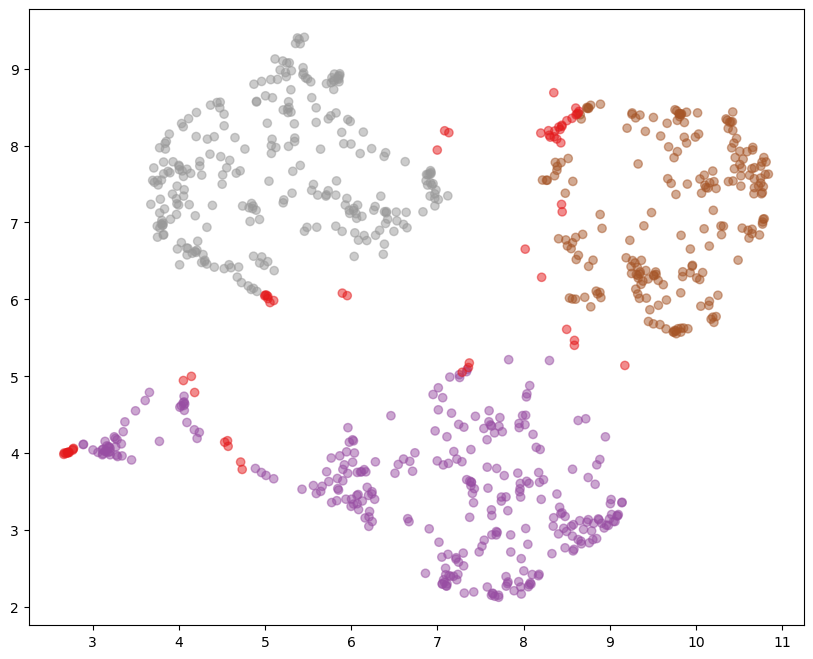

In [17]:
# Run HDBSCAN on the UMAP embedding
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=50)
clusterer.fit(embedding)

# Get the cluster labels
labels = clusterer.labels_

# plot cluster with labeled groups
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)
scatter = ax.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=labels,
    cmap="Set1",
    alpha=0.5,
)

Eaxh point on the cluster is basically an individual fly's response to a stimulus

features_scaled[:, 0]  # heading
features_scaled[:, 1]  # heading_sd
features_scaled[:, 2]  # heading_change
features_scaled[:, 3]  # heading_change_sd
features_scaled[:, 4]  # distance_between_head_and_abdomen
features_scaled[:, 5]  # distance_between_head_and_abdomen_sd
features_scaled[:, 6]  # centroid_velocity
features_scaled[:, 7]  # centroid_velocity_sd
features_scaled[:, 8]  # centroid_acceleration
features_scaled[:, 9]  # centroid_acceleration_sd
features_scaled[:, 10]  # angular_velocity
features_scaled[:, 11]  # angular_velocity_sd

In [18]:
# find which files are in each cluster
clusters = {}
for i, label in enumerate(labels):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(all_features.iloc[i]["file"])

In [19]:
clusters 

{1: ['obj_id_18560_frame_1034466.predictions.csv',
  'obj_id_5840_frame_355993.predictions.csv',
  'obj_id_8671_frame_958713.predictions.csv',
  'obj_id_9836_frame_1672646.predictions.csv',
  'obj_id_9927_frame_1963767.predictions.csv',
  'obj_id_13077_frame_2240025.predictions.csv',
  'obj_id_13989_frame_2920233.predictions.csv',
  'obj_id_24110_frame_7892404.predictions.csv',
  'obj_id_3598_frame_521720.predictions.csv',
  'obj_id_4556_frame_886742.predictions.csv',
  'obj_id_4984_frame_1545265.predictions.csv',
  'obj_id_5276_frame_1958602.predictions.csv',
  'obj_id_7501_frame_2259627.predictions.csv',
  'obj_id_16224_frame_2849767.predictions.csv',
  'obj_id_16310_frame_2862016.predictions.csv',
  'obj_id_18709_frame_3009316.predictions.csv',
  'obj_id_26493_frame_3977275.predictions.csv',
  'obj_id_28639_frame_4345450.predictions.csv',
  'obj_id_29670_frame_4594773.predictions.csv',
  'obj_id_30078_frame_4809739.predictions.csv',
  'obj_id_3606_frame_1630270.predictions.csv',
  '

In [30]:
cluster = []
angular_velocity = []
linear_velocity = []
heading_change=[]
heading =[]
for key, value in clusters.items():
    for file in value:
        cluster.append(key)
        angular_velocity.append(raw_data[file]["angular_velocity"])
        linear_velocity.append(raw_data[file]["centroid_velocity"])
        heading_change.append(raw_data[file]["heading_change"])
        heading.append(raw_data[file]["heading"])

cluster = np.array(cluster)
angular_velocity = np.array(angular_velocity)
linear_velocity =np.array(linear_velocity)
heading_change= np.array(heading_change)


clusters = {
    -1: ["file1.csv", "file4.csv", ...],
    0: ["file2.csv", "file5.csv", ...],
    1: ["file3.csv", "file6.csv", ...],
    ...
}

↓ After processing ↓

cluster = [-1, -1, ..., 0, 0, ..., 1, 1, ...]

angular_velocity = [
    [0.1, 0.2, 0.3, ...],  # Angular velocity for file1.csv (cluster -1)
    [0.2, 0.1, 0.4, ...],  # Angular velocity for file4.csv (cluster -1)
    ...,
    [0.5, 0.7, 0.6, ...],  # Angular velocity for file2.csv (cluster 0)
    [0.4, 0.6, 0.5, ...],  # Angular velocity for file5.csv (cluster 0)
    ...,
    [1.2, 1.5, 1.3, ...],  # Angular velocity for file3.csv (cluster 1)
    [1.3, 1.4, 1.2, ...],  # Angular velocity for file6.csv (cluster 1)
    ...
]
angular_velocity[cluster == 1] = [
    [v1_frame0, v1_frame1, v1_frame2, ..., v1_frame50],  # Fly 1 in cluster 1
    [v2_frame0, v2_frame1, v2_frame2, ..., v2_frame50],  # Fly 2 in cluster 1
    [v3_frame0, v3_frame1, v3_frame2, ..., v3_frame50],  # Fly 3 in cluster 1
    ...
    [vN_frame0, vN_frame1, vN_frame2, ..., vN_frame50]   # Fly N in cluster 1
]

then:
mean1 = [
    mean_frame0,  # Average of [v1_frame0, v2_frame0, v3_frame0, ..., vN_frame0]
    mean_frame1,  # Average of [v1_frame1, v2_frame1, v3_frame1, ..., vN_frame1]
    mean_frame2,  # Average of [v1_frame2, v2_frame2, v3_frame2, ..., vN_frame2]
    ...
    mean_frame50  # Average of [v1_frame50, v2_frame50, v3_frame50, ..., vN_frame50]
]
and then: 
std1= [
    std_frame0,  # Std dev of [v1_frame0, v2_frame0, v3_frame0, ..., vN_frame0]
    std_frame1,  # Std dev of [v1_frame1, v2_frame1, v3_frame1, ..., vN_frame1]
    std_frame2,  # Std dev of [v1_frame2, v2_frame2, v3_frame2, ..., vN_frame2]
    ...
    std_frame50  # Std dev of [v1_frame50, v2_frame50, v3_frame50, ..., vN_frame50]
]

SO BASICALLY it averages all the frames but between videos: For example: (frame1_v1, frame1_v2, ....frameN_vn) 's mean will be stored in frame_1 of mean1, and then similarly frame2,3,4,...n so on
mean1 would be a 1D array with shape (51,)
std1 would be a 1D array with shape (51,)

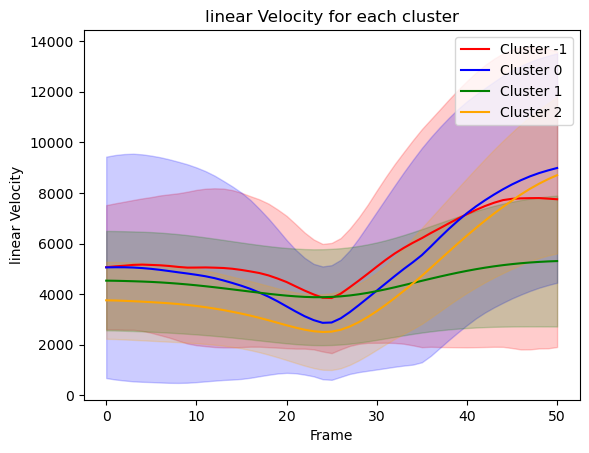

In [26]:
def get_mean_and_std(array):
    mean = np.nanmean(array, axis=0)
    std = np.nanstd(array, axis=0)
    return mean, std

fig = plt.figure()
mean1, std1 = get_mean_and_std(linear_velocity[cluster == -1])
mean2, std2 = get_mean_and_std(linear_velocity[cluster == 0])
mean3, std3 = get_mean_and_std(linear_velocity[cluster == 1])
mean4, std4 = get_mean_and_std(linear_velocity[cluster == 2])


plt.plot(mean1, label="Cluster -1", color="red")
plt.fill_between(
    range(len(mean1)), mean1 - std1, mean1 + std1, color="red", alpha=0.2
)

plt.plot(mean2, label="Cluster 0", color="blue")
plt.fill_between(
    range(len(mean2)), mean2 - std2, mean2 + std2, color="blue", alpha=0.2
)

plt.plot(mean3, label="Cluster 1", color="green")
plt.fill_between(
    range(len(mean3)), mean3 - std3, mean3 + std3, color="green", alpha=0.2
)

plt.plot(mean4, label="Cluster 2", color="orange")
plt.fill_between(
    range(len(mean4)), mean4 - std4, mean4 + std4, color="orange", alpha=0.2
)

plt.title("linear Velocity for each cluster")
plt.xlabel("Frame")
plt.ylabel("linear Velocity")
plt.legend()
plt.show()

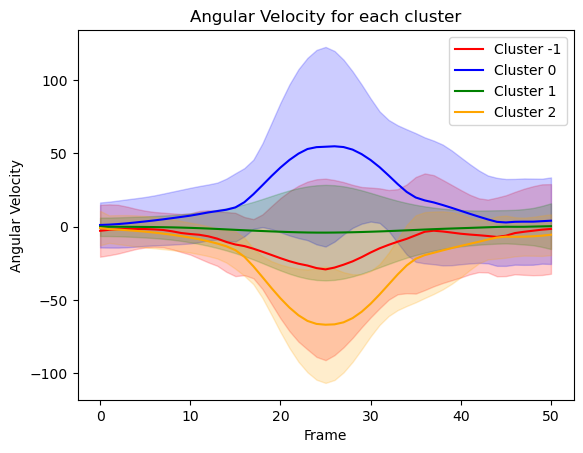

In [23]:
def get_mean_and_std(array):
    mean = np.nanmean(array, axis=0)
    std = np.nanstd(array, axis=0)
    return mean, std

fig = plt.figure()
mean1, std1 = get_mean_and_std(angular_velocity[cluster == -1])
mean2, std2 = get_mean_and_std(angular_velocity[cluster == 0])
mean3, std3 = get_mean_and_std(angular_velocity[cluster == 1])
mean4, std4 = get_mean_and_std(angular_velocity[cluster == 2])


plt.plot(mean1, label="Cluster -1", color="red")
plt.fill_between(
    range(len(mean1)), mean1 - std1, mean1 + std1, color="red", alpha=0.2
)

plt.plot(mean2, label="Cluster 0", color="blue")
plt.fill_between(
    range(len(mean2)), mean2 - std2, mean2 + std2, color="blue", alpha=0.2
)

plt.plot(mean3, label="Cluster 1", color="green")
plt.fill_between(
    range(len(mean3)), mean3 - std3, mean3 + std3, color="green", alpha=0.2
)

plt.plot(mean4, label="Cluster 2", color="orange")
plt.fill_between(
    range(len(mean4)), mean4 - std4, mean4 + std4, color="orange", alpha=0.2
)

plt.title("Angular Velocity for each cluster")
plt.xlabel("Frame")
plt.ylabel("Angular Velocity")
plt.legend()
plt.show()


In [27]:
heading

array([[-2.63406606, -2.65579437, -2.68138564, ..., -3.87556269,
        -3.83317314, -3.82279797],
       [-1.45945799, -1.45713729, -1.45475541, ..., -2.41742221,
        -2.38498575, -2.35281526],
       [-0.64430926, -0.64989561, -0.66026629, ..., -1.97488613,
        -1.94706329, -1.91793798],
       ...,
       [ 2.38356705,  2.37110117,  2.35957745, ...,  2.13880643,
         2.13901695,  2.14129966],
       [-1.28221024, -1.25550579, -1.2325135 , ..., -3.02040066,
        -3.00347104, -2.98707661],
       [-4.02204521, -4.02233746, -4.01125032, ..., -5.44629018,
        -5.44742259, -5.44737097]])

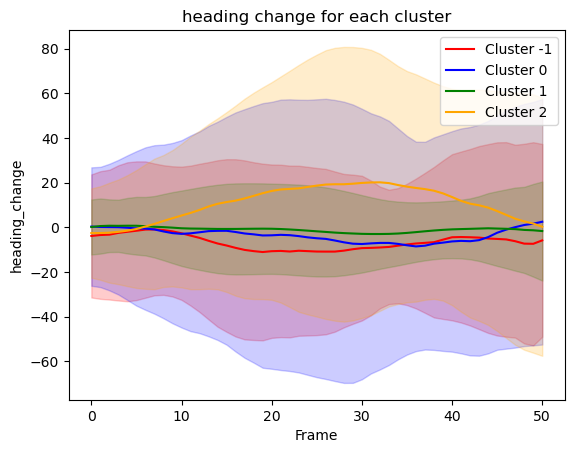

'Positive values of heading_change: The fly is turning counterclockwise\nNegative values: The fly is turning clockwise\nLarger absolute values: Faster turning'

In [31]:
def get_mean_and_std(array):
    mean = np.nanmean(array, axis=0)
    std = np.nanstd(array, axis=0)
    return mean, std

fig = plt.figure()
mean1, std1 = get_mean_and_std(heading_change[cluster == -1])
mean2, std2 = get_mean_and_std(heading_change[cluster == 0])
mean3, std3 = get_mean_and_std(heading_change[cluster == 1])
mean4, std4 = get_mean_and_std(heading_change[cluster == 2])


plt.plot(mean1, label="Cluster -1", color="red")
plt.fill_between(
    range(len(mean1)), mean1 - std1, mean1 + std1, color="red", alpha=0.2
)

plt.plot(mean2, label="Cluster 0", color="blue")
plt.fill_between(
    range(len(mean2)), mean2 - std2, mean2 + std2, color="blue", alpha=0.2
)

plt.plot(mean3, label="Cluster 1", color="green")
plt.fill_between(
    range(len(mean3)), mean3 - std3, mean3 + std3, color="green", alpha=0.2
)

plt.plot(mean4, label="Cluster 2", color="orange")
plt.fill_between(
    range(len(mean4)), mean4 - std4, mean4 + std4, color="orange", alpha=0.2
)

plt.title("heading change for each cluster")
plt.xlabel("Frame")
plt.ylabel("heading_change")
plt.legend()
plt.show()

'''Positive values of heading_change: The fly is turning counterclockwise
Negative values: The fly is turning clockwise
Larger absolute values: Faster turning'''

| Index | Feature Name                              |
| ----- | ----------------------------------------- |
| 0     | heading                                   |
| 1     | heading\_sd                               |
| 2     | heading\_change                           |
| 3     | heading\_change\_sd                       |
| 4     | distance\_between\_head\_and\_abdomen     |
| 5     | distance\_between\_head\_and\_abdomen\_sd |
| 6     | centroid\_velocity                        |
| 7     | centroid\_velocity\_sd                    |
| 8     | centroid\_acceleration                    |
| 9     | centroid\_acceleration\_sd                |
| 10    | angular\_velocity                         |
| 11    | angular\_velocity\_sd                     |


Cluster distribution:
 0    299
 2    262
 1    208
-1     62
Name: cluster, dtype: int64
Feature comparison across clusters:
        angular_velocity                       centroid_velocity               \
                    mean     median        std              mean       median   
cluster                                                                         
-1            -10.239171 -16.426721  17.223535       5636.127645  4859.283284   
 0             19.950289  24.465656  16.464267       5308.590086  4733.667048   
 1             -1.732969  -2.181023  14.454832       4455.212281  4220.146108   
 2            -23.894327 -25.357014   7.445849       4432.965273  4494.350684   

                     heading_change                        
                 std           mean     median        std  
cluster                                                    
-1       3083.382645      -6.658873 -10.305626  15.395300  
 0       2889.320848      -3.559017  -4.600410  24.799989  
 1    

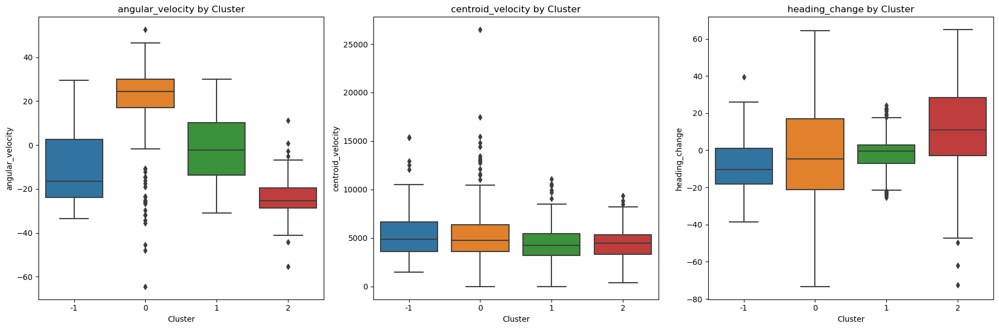

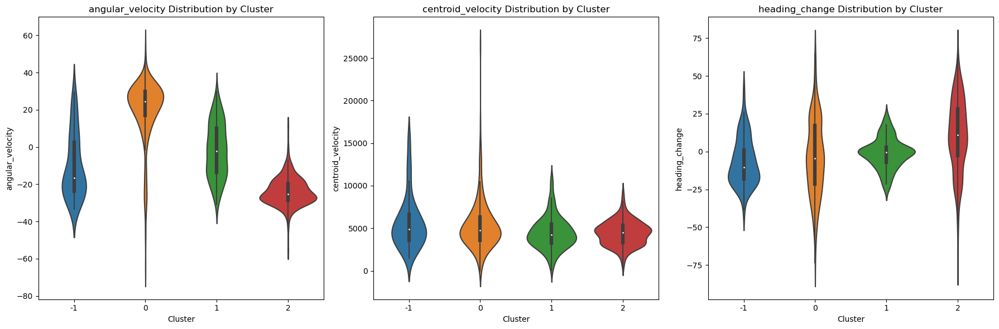

In [33]:
file_to_cluster = {}
for cluster_label, file_list in clusters.items():
    for filename in file_list:
        file_to_cluster[filename] = cluster_label

# Add a 'cluster' column to your DataFrame
all_features['cluster'] = all_features['file'].map(file_to_cluster)

# Verify the cluster column was added correctly
print("Cluster distribution:")
print(all_features['cluster'].value_counts())

# Select the features you're interested in
my_features = ['angular_velocity', 'centroid_velocity', 'heading_change']  
# Replace with your preferred features

# 1. Compare these features across clusters
cluster_comparison = all_features.groupby('cluster')[my_features].agg(['mean', 'median', 'std'])
print("Feature comparison across clusters:")
print(cluster_comparison)

# 2. Visualize these features with boxplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.flatten()

for i, feature in enumerate(my_features):
    sns.boxplot(x='cluster', y=feature, data=all_features, ax=axes[i])
    axes[i].set_title(f'{feature} by Cluster')
    axes[i].set_xlabel('Cluster')

plt.tight_layout()
plt.show()

# 3. Create violin plots to see distributions
fig, axes = plt.subplots(1,3, figsize=(18,6))
axes = axes.flatten()

for i, feature in enumerate(my_features):
    sns.violinplot(x='cluster', y=feature, data=all_features, ax=axes[i])
    axes[i].set_title(f'{feature} Distribution by Cluster')
    axes[i].set_xlabel('Cluster')

plt.tight_layout()
plt.show()

#angular velovity is in radians/sec
#centroid_velocity is in pixels/sec
#heading_change is in radians/sec


In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan
from matplotlib.colors import ListedColormap

# Function to perform subclustering on a single feature within a main cluster
def subcluster_feature(all_features, main_cluster_id, feature='angular_velocity', 
                       min_cluster_size=15, min_samples=5):
    """
    Perform HDBSCAN subclustering on a single feature within a specific main cluster.
    
    Parameters:
    -----------
    all_features : DataFrame
        The complete dataset containing the main clusters
    main_cluster_id : int
        The ID of the main cluster to subcluster
    feature : str
        The feature to use for subclustering (default: 'angular_velocity')
    min_cluster_size : int
        Minimum size of subclusters for HDBSCAN
    min_samples : int
        HDBSCAN min_samples parameter
        
    Returns:
    --------
    subcluster_data : DataFrame
        Data for the specified cluster with subcluster labels added
    """
    # Extract data for the specified main cluster
    cluster_data = all_features[all_features['cluster'] == main_cluster_id].copy()
    
    if len(cluster_data) == 0:
        print(f"No data found for cluster {main_cluster_id}")
        return None
    
    # Extract the feature and reshape for HDBSCAN
    X = cluster_data[feature].values.reshape(-1, 1)
    
    # Apply HDBSCAN
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size,
        min_samples=min_samples,
        gen_min_span_tree=True
    )
    
    # Fit and predict
    subcluster_labels = clusterer.fit_predict(X)
    
    # Add subcluster labels to data
    cluster_data['subcluster'] = subcluster_labels
    
    # Count points in each subcluster
    subcluster_counts = pd.Series(subcluster_labels).value_counts().sort_index()
    print(f"\nSubclusters for Main Cluster {main_cluster_id} using {feature}:")
    print(subcluster_counts)
    print(f"Noise points (labeled -1): {(subcluster_labels == -1).sum()}")
    
    return cluster_data


subcluster_feature(all_features, 1, feature='angular_velocity', 
                       min_cluster_size=20, min_samples=3)


Subclusters for Main Cluster 1 using angular_velocity:
-1    35
 0    20
 1    33
 2    58
 3    26
 4    36
dtype: int64
Noise points (labeled -1): 35


,file,group,time,x,y,heading,heading_sd,heading_change,heading_change_sd,distance_between_head_and_abdomen,distance_between_head_and_abdomen_sd,centroid_velocity,centroid_velocity_sd,centroid_acceleration,centroid_acceleration_sd,angular_velocity,angular_velocity_sd,response_delay,cluster,subcluster
0,obj_id_18560_frame_1034466.predictions.csv,Native,386.0,1060.703102,1584.198466,-3.617408,0.560070,-11.660284,19.738121,22.137752,6.990796,3329.209585,0.0,39169.001063,44441.926935,-18.142981,10.427571,386.0,1,2
1,obj_id_5840_frame_355993.predictions.csv,Native,413.0,1683.946430,263.831255,-2.039293,0.435883,-8.648936,13.233960,58.702744,3.793115,2971.771887,0.0,23259.402772,47695.037896,-22.245245,19.952889,413.0,1,-1
3,obj_id_8671_frame_958713.predictions.csv,Native,389.0,1923.273614,1006.061592,-1.572818,0.569950,-12.301117,16.928329,59.323148,4.395199,5484.462156,0.0,31509.743610,43375.366905,-17.722877,12.998849,389.0,1,2
5,obj_id_9836_frame_1672646.predictions.csv,Native,401.0,392.186861,1340.896515,1.798287,0.431133,-6.472990,17.663650,67.992552,6.633706,6229.785840,0.0,50998.229445,59428.083283,-16.429598,12.163307,401.0,1,2
6,obj_id_9927_frame_1963767.predictions.csv,Native,360.0,780.815492,1345.479085,3.862888,0.437154,11.255063,11.179460,54.169070,4.242954,5379.178740,0.0,11457.218006,29183.833649,14.027752,7.460520,360.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,obj_id_33278_frame_386629_tracked.csv,Canton-s,390.0,1999.584681,943.811553,4.661727,0.049628,-1.507695,2.480840,28.331154,1.748430,1017.469829,0.0,-4135.147951,19194.199555,5.475528,4.098434,390.0,1,3
817,obj_id_33455_frame_394078_tracked.csv,Canton-s,390.0,1283.218776,1059.984445,-6.181724,0.116114,1.629827,5.846761,35.989652,0.892148,7020.882650,0.0,-17661.322512,4487.637515,2.923091,2.638244,390.0,1,3
818,obj_id_34115_frame_404202_tracked.csv,Canton-s,397.0,1962.985470,1055.281376,-6.552460,0.517333,-18.387134,23.540685,20.497288,8.737660,3199.174795,0.0,12355.979393,55538.497778,-29.895753,18.857839,397.0,1,-1
819,obj_id_34115_frame_407407_tracked.csv,Canton-s,390.0,1376.027914,263.478309,-1.935929,0.049695,1.423071,3.680074,36.389403,1.657073,3576.138823,0.0,15479.722988,10371.504024,3.428874,9.373349,390.0,1,3


In [53]:
def generate_subcluster_arrays(all_features, main_cluster_id, feature='angular_velocity',
                              min_cluster_size=20, min_samples=3):
    """
    Perform subclustering and generate arrays for plotting.
    
    Parameters:
    -----------
    all_features : DataFrame
        The complete dataset with features and cluster assignments
    main_cluster_id : int
        The ID of the main cluster to subcluster
    feature : str
        The feature to use for subclustering
    min_cluster_size, min_samples : int
        HDBSCAN parameters
    
    Returns:
    --------
    Dictionary containing subclustered data arrays
    """
    # First perform the subclustering
    cluster_data = subcluster_feature(all_features, main_cluster_id, feature, 
                                     min_cluster_size, min_samples)
    
    if cluster_data is None or len(cluster_data) == 0:
        print(f"No data found for cluster {main_cluster_id}")
        return None
    
    # Initialize arrays to store data
    subcluster = []
    angular_velocity_sub = []
    linear_velocity_sub = []
    heading_change_sub = []

    
    # Get a list of files and their corresponding subclusters
    files = cluster_data['file'].values
    subclusters = cluster_data['subcluster'].values
    
    # Create a mapping from file to subcluster
    file_to_subcluster = dict(zip(files, subclusters))
    
    # Extract features from raw_data for each file
    for file, subcluster_id in file_to_subcluster.items():
        subcluster.append(subcluster_id)
        angular_velocity_sub.append(raw_data[file]["angular_velocity"])
        linear_velocity_sub.append(raw_data[file]["centroid_velocity"])
        heading_change_sub.append(raw_data[file]["heading_change"])
    
    # Convert to numpy arrays
    subcluster = np.array(subcluster)
    angular_velocity_sub = np.array(angular_velocity_sub)
    linear_velocity_sub = np.array(linear_velocity_sub)
    heading_change_sub = np.array(heading_change_sub)
    
    # Return as a dictionary for easy access
    return {
        'subcluster': subcluster,
        'angular_velocity': angular_velocity_sub,
        'linear_velocity': linear_velocity_sub,
        'heading_change': heading_change_sub,
        'main_cluster_id': main_cluster_id
    }

# Example usage for a specific main cluster
subcluster_data = generate_subcluster_arrays(all_features, main_cluster_id=0, 
                                           feature='angular_velocity')

# If you want to do this for all main clusters
all_subcluster_data = {}
for main_cluster_id in all_features['cluster'].unique():
    subcluster_data = generate_subcluster_arrays(all_features, main_cluster_id)
    if subcluster_data:
        all_subcluster_data[main_cluster_id] = subcluster_data


Subclusters for Main Cluster 0 using angular_velocity:
-1     28
 0     21
 1     32
 2    218
dtype: int64
Noise points (labeled -1): 28

Subclusters for Main Cluster 1 using angular_velocity:
-1    35
 0    20
 1    33
 2    58
 3    26
 4    36
dtype: int64
Noise points (labeled -1): 35

Subclusters for Main Cluster 2 using angular_velocity:
-1     55
 0    127
 1     35
 2     45
dtype: int64
Noise points (labeled -1): 55

Subclusters for Main Cluster 0 using angular_velocity:
-1     28
 0     21
 1     32
 2    218
dtype: int64
Noise points (labeled -1): 28

Subclusters for Main Cluster -1 using angular_velocity:
-1    62
dtype: int64
Noise points (labeled -1): 62


No valid subclusters found for main cluster -1
No valid subclusters found for main cluster -1
No valid subclusters found for main cluster -1
Saved: ./subcluster_angular_velocity_cluster1.png


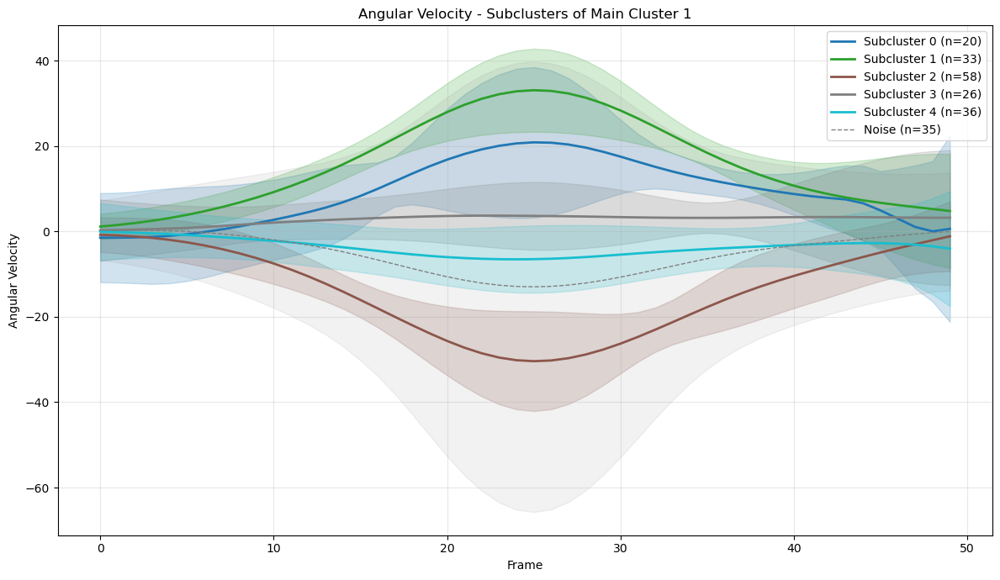

Saved: ./subcluster_linear_velocity_cluster1.png


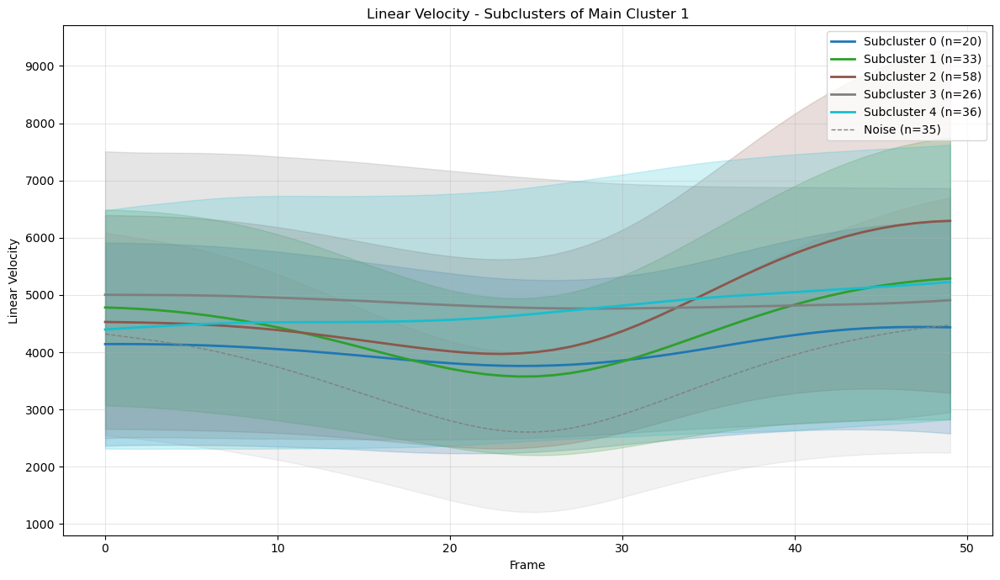

Saved: ./subcluster_heading_change_cluster1.png


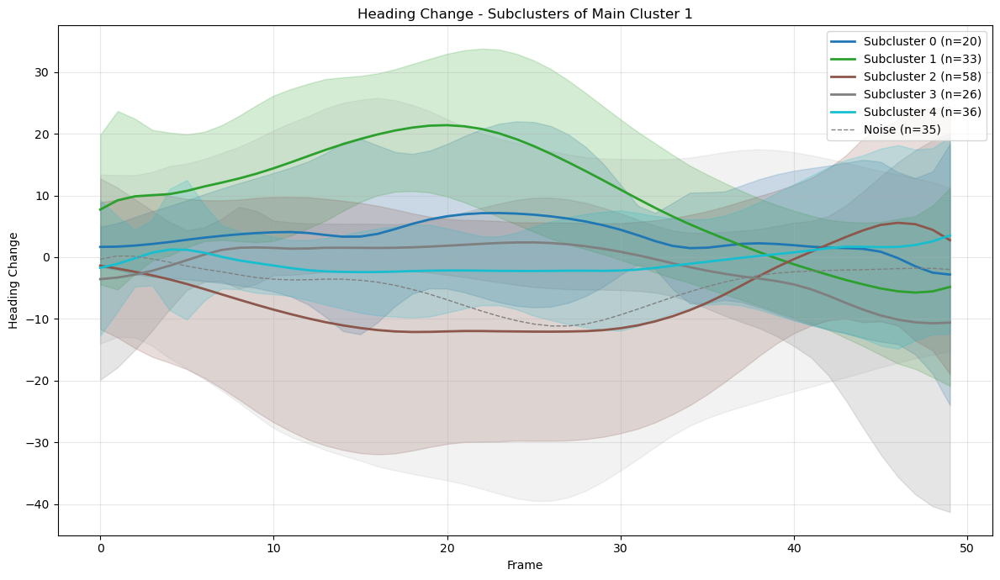

Saved: ./subcluster_angular_velocity_cluster2.png


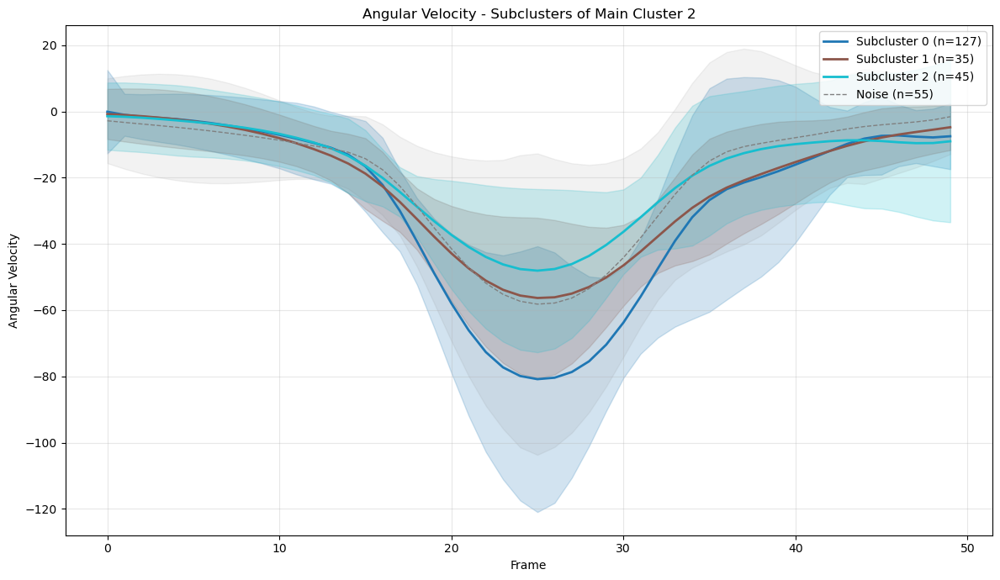

Saved: ./subcluster_linear_velocity_cluster2.png


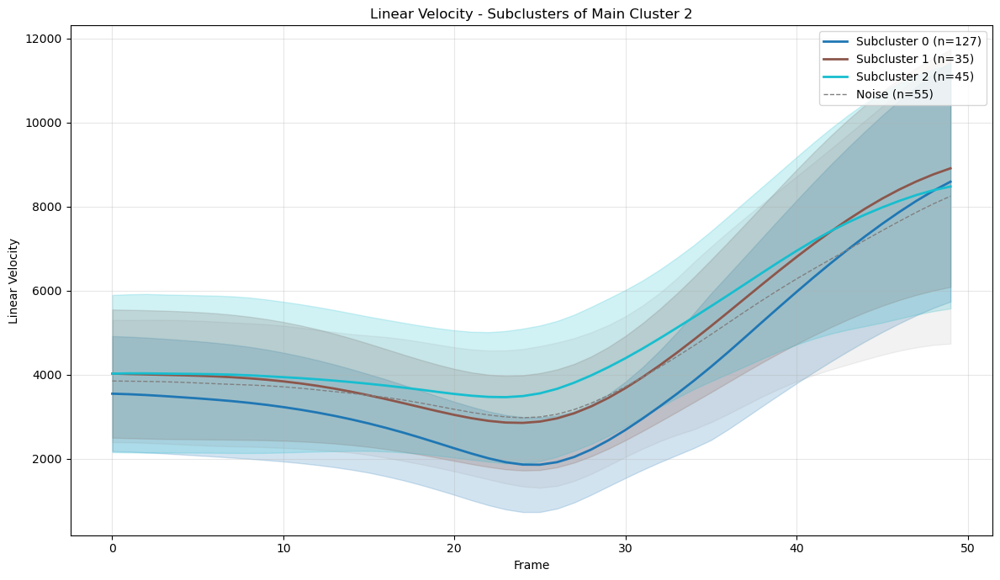

Saved: ./subcluster_heading_change_cluster2.png


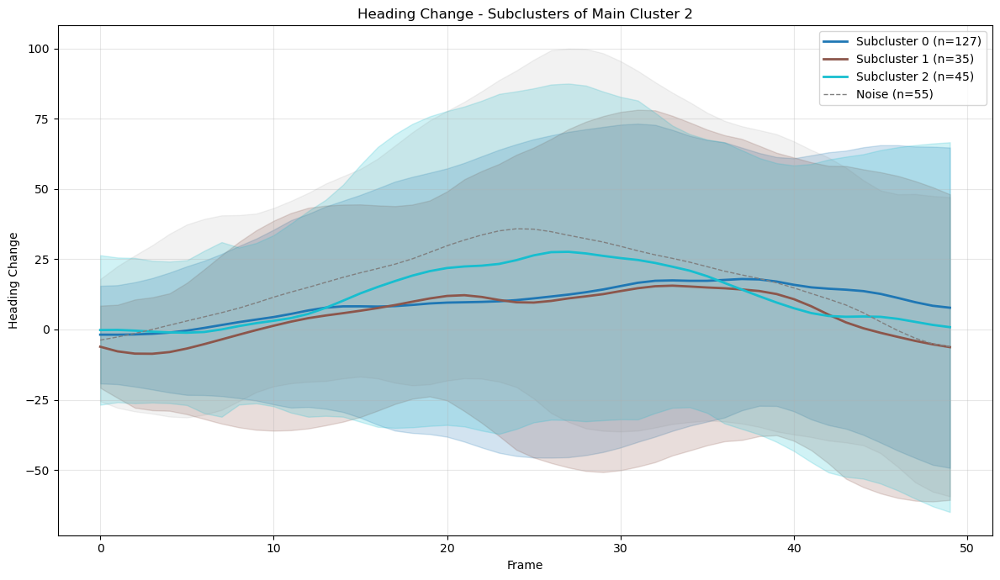

Saved: ./subcluster_angular_velocity_cluster0.png


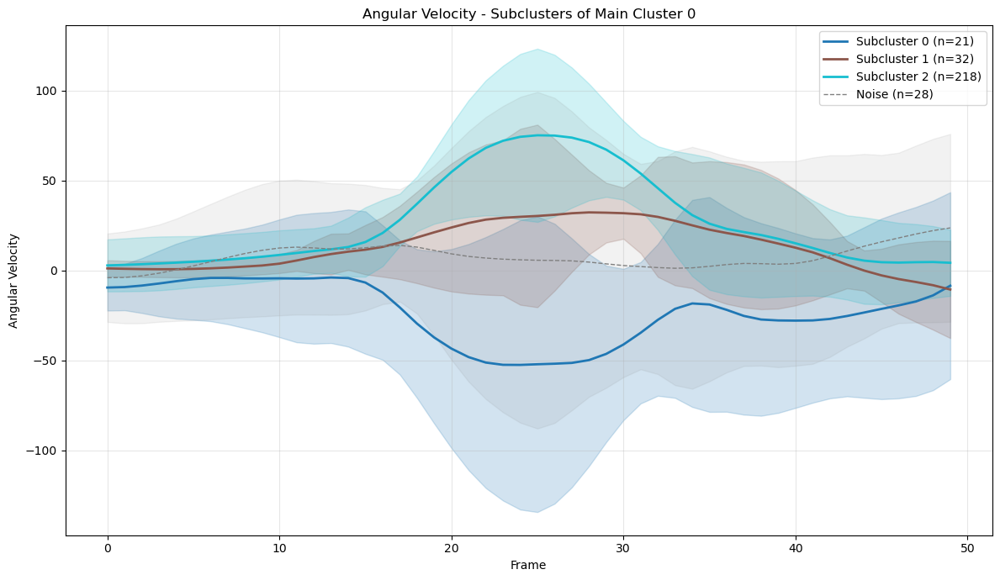

Saved: ./subcluster_linear_velocity_cluster0.png


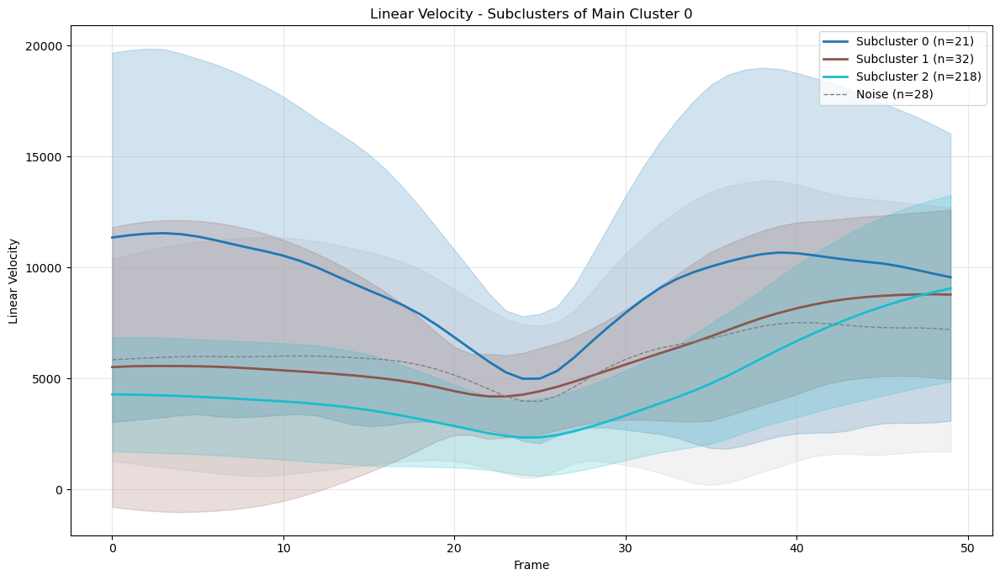

Saved: ./subcluster_heading_change_cluster0.png


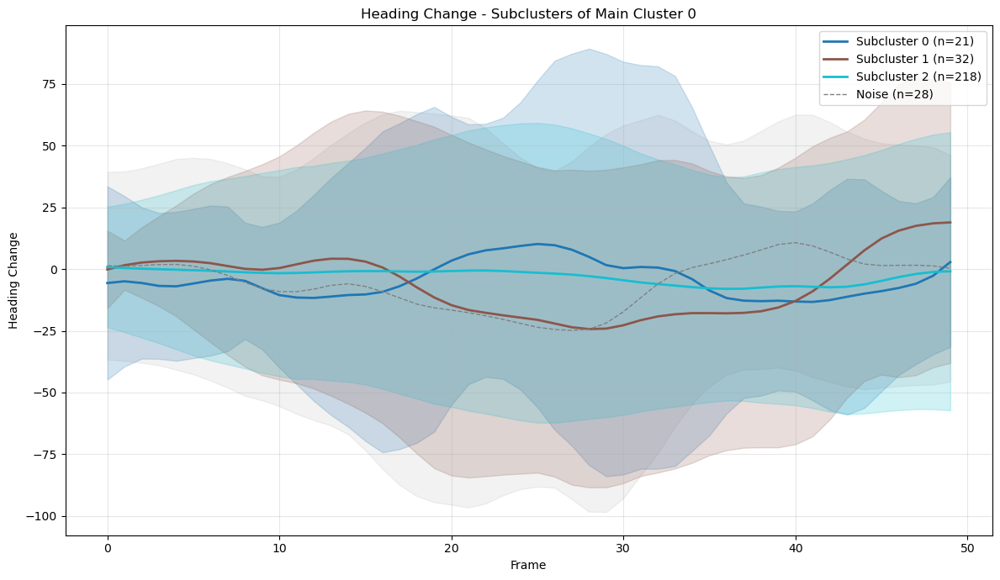

No valid subclusters found for main cluster -1
No valid subclusters found for main cluster -1
No valid subclusters found for main cluster -1


In [54]:
def plot_subcluster_temporal(subcluster_data, feature_name='angular_velocity', output_dir="./"):
    """
    Plot temporal patterns for subclusters.
    
    Parameters:
    -----------
    subcluster_data : dict
        Dictionary containing subclustered data arrays
    feature_name : str
        Name of the feature to plot ('angular_velocity', 'linear_velocity', 'heading_change', or 'heading')
    output_dir : str
        Directory to save the plot
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    
    # Extract data
    subcluster_labels = subcluster_data['subcluster']
    feature_arrays = subcluster_data[feature_name]
    main_cluster_id = subcluster_data['main_cluster_id']
    
    # Identify unique subclusters (excluding noise if present)
    unique_subclusters = sorted([c for c in np.unique(subcluster_labels) if c >= 0])
    
    # Check if we have valid subclusters
    if len(unique_subclusters) == 0:
        print(f"No valid subclusters found for main cluster {main_cluster_id}")
        return
    
    # Create figure
    plt.figure(figsize=(12, 7))
    
    # Set colors for subclusters
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_subclusters)))
    
    # Plot each subcluster
    for i, sub_id in enumerate(unique_subclusters):
        # Get data for this subcluster
        mask = subcluster_labels == sub_id
        sub_arrays = feature_arrays[mask]
        
        # Prepare arrays for analysis
        max_frames = 50  # Standard length for visualization
        
        # Stack arrays of sufficient length
        stacked_arrays = []
        for arr in sub_arrays:
            if len(arr) >= max_frames:
                stacked_arrays.append(arr[:max_frames])
        
        if len(stacked_arrays) == 0:
            print(f"No data of sufficient length for subcluster {sub_id}")
            continue
        
        stacked = np.vstack(stacked_arrays)
        
        # Calculate mean and std
        mean = np.nanmean(stacked, axis=0)
        std = np.nanstd(stacked, axis=0)
        
        # Smooth the mean for clearer visualization (optional)
        if len(mean) > 7:
            mean_smooth = savgol_filter(mean, min(7, len(mean) - (len(mean) % 2 - 1)), 3)
        else:
            mean_smooth = mean
        
        # Plot
        frames = range(len(mean))
        plt.plot(frames, mean_smooth, label=f"Subcluster {sub_id} (n={sum(mask)})",
                color=colors[i], linewidth=2)
        plt.fill_between(frames, mean_smooth - std, mean_smooth + std, 
                        color=colors[i], alpha=0.2)
    
    # Add noise points as a gray line if there are any
    if -1 in subcluster_labels:
        noise_mask = subcluster_labels == -1
        noise_arrays = feature_arrays[noise_mask]
        
        stacked_noise = []
        for arr in noise_arrays:
            if len(arr) >= max_frames:
                stacked_noise.append(arr[:max_frames])
        
        if len(stacked_noise) > 0:
            stacked_noise = np.vstack(stacked_noise)
            noise_mean = np.nanmean(stacked_noise, axis=0)
            noise_std = np.nanstd(stacked_noise, axis=0)
            
            if len(noise_mean) > 7:
                noise_mean_smooth = savgol_filter(noise_mean, min(7, len(noise_mean) - (len(noise_mean) % 2 - 1)), 3)
            else:
                noise_mean_smooth = noise_mean
                
            plt.plot(frames, noise_mean_smooth, label=f"Noise (n={sum(noise_mask)})",
                    color='gray', linewidth=1, linestyle='--')
            plt.fill_between(frames, noise_mean_smooth - noise_std, noise_mean_smooth + noise_std, 
                            color='gray', alpha=0.1)
    
    # Add labels and title
    plt.title(f"{feature_name.replace('_', ' ').title()} - Subclusters of Main Cluster {main_cluster_id}")
    plt.xlabel("Frame")
    plt.ylabel(f"{feature_name.replace('_', ' ').title()}")
    plt.grid(True, alpha=0.3)
    plt.legend(loc='best')
    plt.tight_layout()
    
    # Save figure
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"subcluster_{feature_name}_cluster{main_cluster_id}.png")
    plt.savefig(output_file, dpi=300)
    print(f"Saved: {output_file}")
    plt.show()
    plt.close()

# Example usage - plot all features for a specific main cluster
for feature in ['angular_velocity', 'linear_velocity', 'heading_change']:
    plot_subcluster_temporal(subcluster_data, feature_name=feature)

# To plot all features for all main clusters
for main_cluster_id, data in all_subcluster_data.items():
    for feature in ['angular_velocity', 'linear_velocity', 'heading_change']:
        plot_subcluster_temporal(data, feature_name=feature)


Subclusters for Main Cluster 1 using angular_velocity:
-1    35
 0    20
 1    33
 2    58
 3    26
 4    36
dtype: int64
Noise points (labeled -1): 35


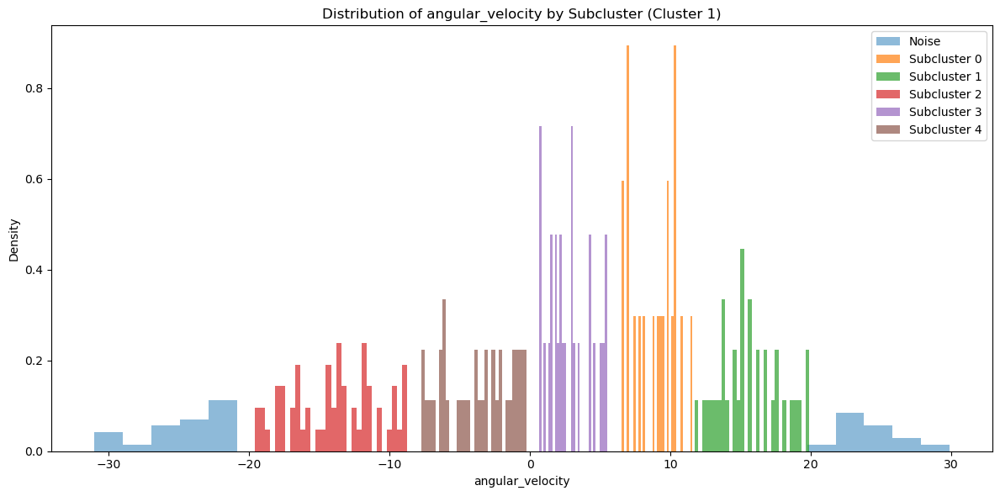

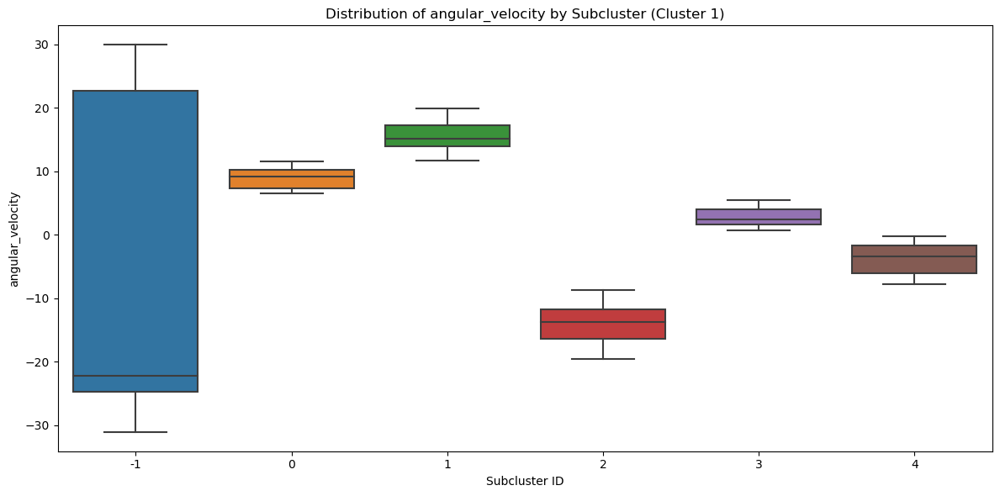


Statistics for angular_velocity by Subcluster:
            count   mean  median    std    min    max
subcluster                                           
-1             35  -5.18  -22.24  24.42 -31.03  29.90
 0             20   8.86    9.19   1.56   6.53  11.57
 1             33  15.63   15.11   2.19  11.73  19.89
 2             58 -13.98  -13.78   3.10 -19.60  -8.75
 3             26   2.78    2.41   1.53   0.64   5.48
 4             36  -3.71   -3.43   2.37  -7.73  -0.25

Statistics for centroid_velocity by angular_velocity subcluster:
               mean   median      std
subcluster                           
-1          3570.02  3308.11  1552.38
 0          4067.22  4073.68  1599.19
 1          4381.59  4048.99  1646.79
 2          4794.80  4683.73  1812.42
 3          4863.31  4345.22  2258.83
 4          4757.00  4386.01  2214.26

Statistics for heading_change by angular_velocity subcluster:
            mean  median    std
subcluster                     
-1         -4.51   -5.9

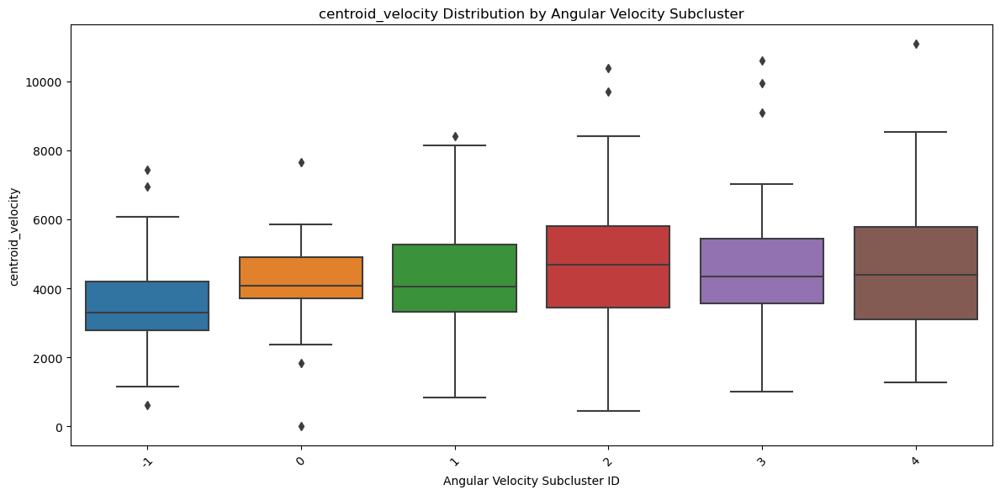

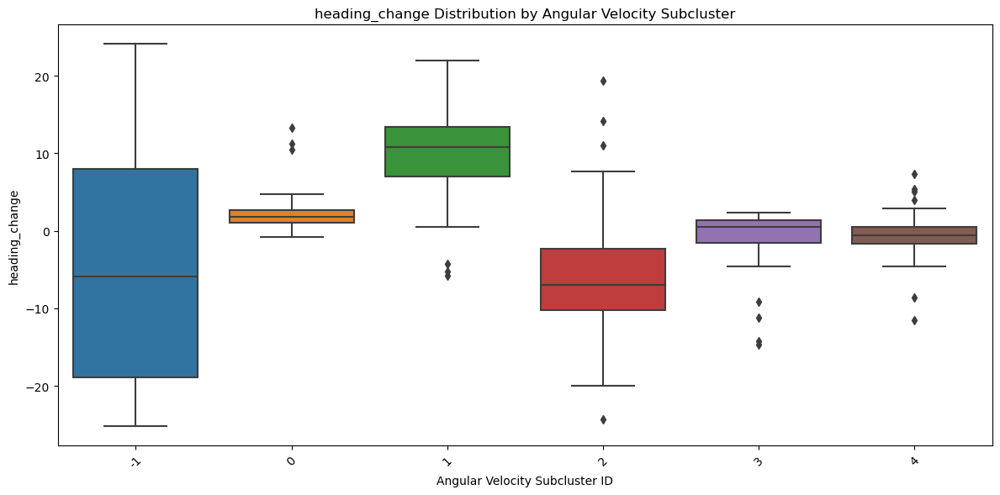

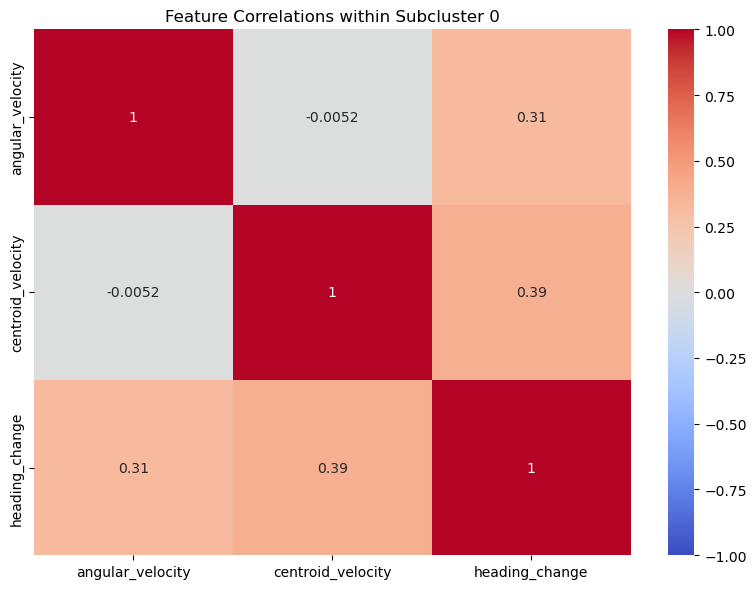

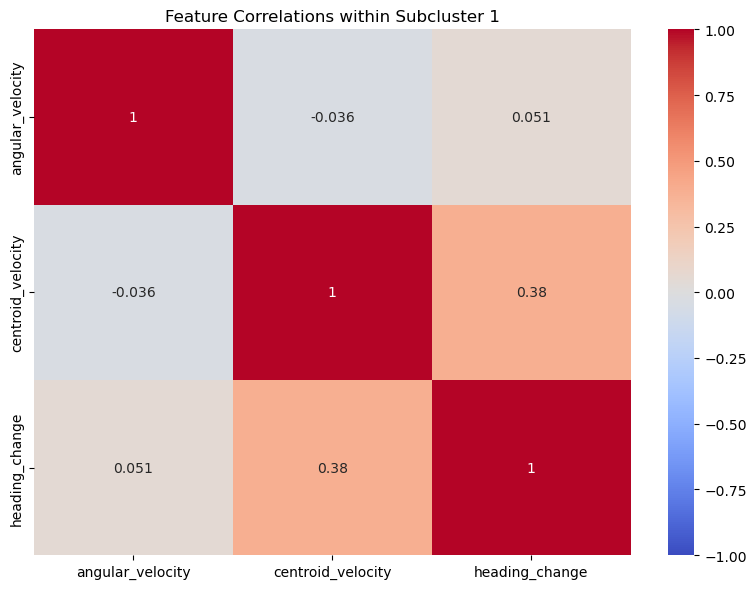

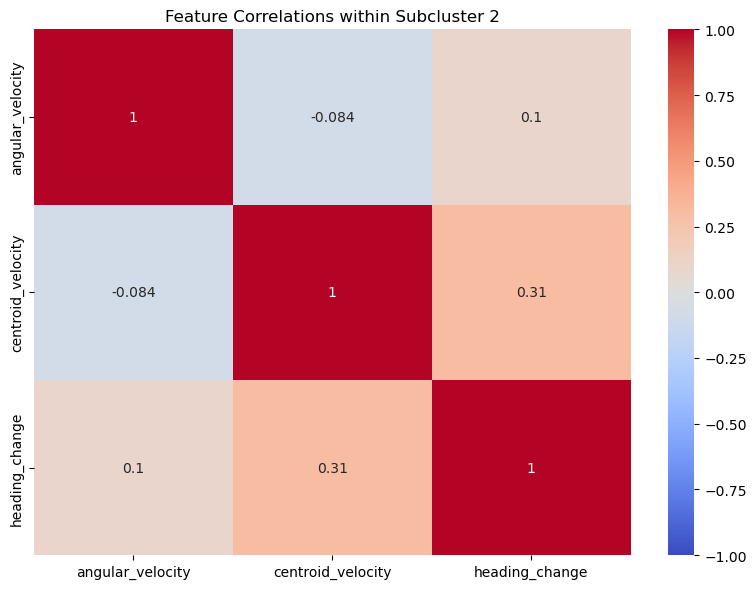

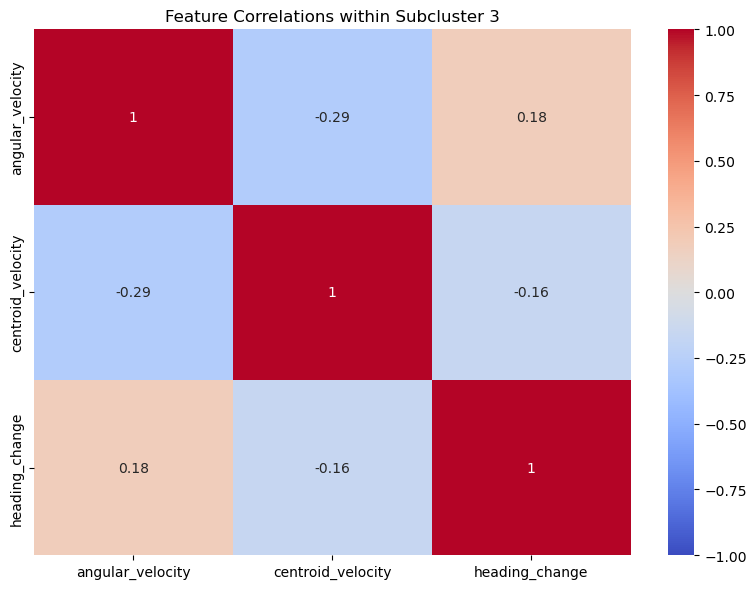

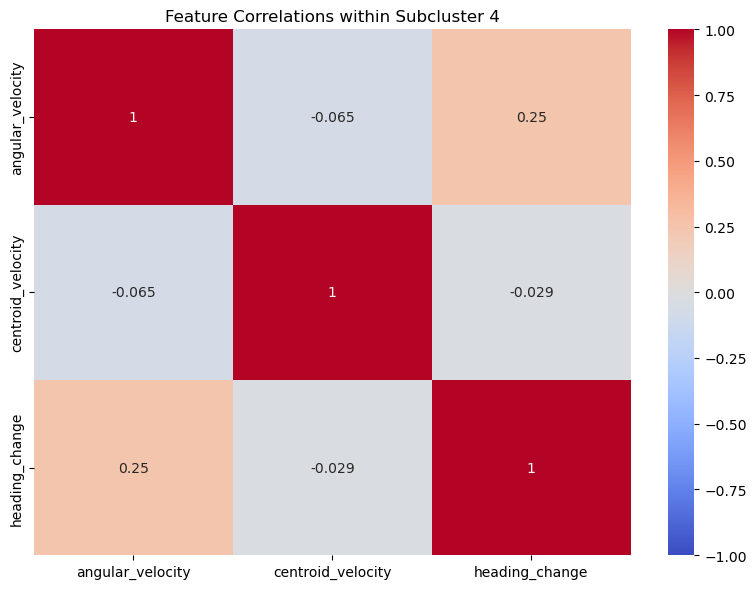

In [56]:
# Function to analyze and visualize the subclusters
def analyze_subclusters(subcluster_data, feature='angular_velocity', main_cluster_id=None):
    """
    Analyze and visualize subclusters based on a single feature.
    
    Parameters:
    -----------
    subcluster_data : DataFrame
        Data with subcluster labels
    feature : str
        The feature used for subclustering
    main_cluster_id : int
        The ID of the main cluster (for plot titles)
    """
    if subcluster_data is None or len(subcluster_data) == 0:
        return
    
    # 1. Histogram of the feature by subcluster
    plt.figure(figsize=(12, 6))
    
    # Create a colormap for subclusters
    n_subclusters = len(subcluster_data['subcluster'].unique())
    colors = plt.cm.tab10(np.linspace(0, 1, n_subclusters))
    
    # Plot histogram for each subcluster
    for subcluster_id in sorted(subcluster_data['subcluster'].unique()):
        subcluster = subcluster_data[subcluster_data['subcluster'] == subcluster_id]
        label = 'Noise' if subcluster_id == -1 else f'Subcluster {subcluster_id}'
        alpha = 0.5 if subcluster_id == -1 else 0.7
        
        plt.hist(
            subcluster[feature], 
            bins=30, 
            alpha=alpha, 
            label=label,
            density=True
        )
    
    plt.title(f'Distribution of {feature} by Subcluster (Cluster {main_cluster_id})')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # 2. Boxplot of the feature by subcluster
    plt.figure(figsize=(12, 6))
    
    # Create boxplot
    sns.boxplot(
        x='subcluster', 
        y=feature, 
        data=subcluster_data,
        palette='tab10'
    )
    
    plt.title(f'Distribution of {feature} by Subcluster (Cluster {main_cluster_id})')
    plt.xlabel('Subcluster ID')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()
    
    # 3. Summary statistics by subcluster
    subcluster_stats = subcluster_data.groupby('subcluster')[feature].agg([
        'count', 'mean', 'median', 'std', 'min', 'max'
    ]).round(2)
    
    print(f"\nStatistics for {feature} by Subcluster:")
    print(subcluster_stats)
    
# Perform subclustering and analysis for a specific main cluster
cluster_to_analyze = 1 # Change to the cluster you want to analyze
feature_to_use = 'angular_velocity'  # Change to your desired feature

# You may need to adjust these parameters based on your data
min_cluster_size = 20 # Minimum number of points to form a subcluster
min_samples = 3       # HDBSCAN min_samples parameter

# Perform subclustering
subcluster_data = subcluster_feature(
    all_features, 
    main_cluster_id=cluster_to_analyze,
    feature=feature_to_use,
    min_cluster_size=min_cluster_size,
    min_samples=min_samples
)

# Analyze the subclusters
if subcluster_data is not None:
    analyze_subclusters(
        subcluster_data, 
        feature=feature_to_use, 
        main_cluster_id=cluster_to_analyze
    )
    
# List of features to analyze
other_features = ['centroid_velocity', 'heading_change']

# Create a comprehensive summary for all features by subcluster
feature_summary = {}

for feature in other_features:
    # Calculate statistics for this feature across all subclusters
    feature_stats = subcluster_data.groupby('subcluster')[feature].agg([
        'mean', 'median', 'std'
    ]).round(2)
    
    feature_summary[feature] = feature_stats

# Print summary for each feature
for feature, stats in feature_summary.items():
    print(f"\nStatistics for {feature} by angular_velocity subcluster:")
    print(stats)

# Create visualizations for each feature
for feature in other_features:
    plt.figure(figsize=(12, 6))
    
    # Create boxplot
    sns.boxplot(
        x='subcluster', 
        y=feature, 
        data=subcluster_data,
        palette='tab10'
    )
    
    plt.title(f'{feature} Distribution by Angular Velocity Subcluster')
    plt.xlabel('Angular Velocity Subcluster ID')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Create a correlation heatmap for a specific subcluster
for subcluster_id in sorted(subcluster_data['subcluster'].unique()):
    if subcluster_id == -1:  # Skip noise points
        continue
        
    # Get data for this subcluster
    sc_data = subcluster_data[subcluster_data['subcluster'] == subcluster_id]
    
    # If we have enough data points
    if len(sc_data) >= 5:
        # Calculate correlation matrix
        features_to_correlate = ['angular_velocity'] + other_features
        corr_matrix = sc_data[features_to_correlate].corr()
        
        # Create heatmap
        plt.figure(figsize=(8, 6))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title(f'Feature Correlations within Subcluster {subcluster_id}')
        plt.tight_layout()
        plt.show()

In [57]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import umap
import hdbscan

class DrosophilaFlightClassifier:
    """
    Classifier for Drosophila flight responses based on existing clusters
    """
    def __init__(self):
        # Classifiers for main clusters and subclusters
        self.main_classifier = None
        self.subcluster_classifiers = {}
        
        # Feature transformers
        self.scaler = None
        self.umap_reducer = None
        
        # Feature names and preprocessing info
        self.feature_names = [
            'heading', 'heading_sd', 'heading_change', 'heading_change_sd',
            'distance_between_head_and_abdomen', 'distance_between_head_and_abdomen_sd',
            'centroid_velocity', 'centroid_velocity_sd', 
            'centroid_acceleration', 'centroid_acceleration_sd',
            'angular_velocity', 'angular_velocity_sd'
        ]
        
    def train_with_existing_clusters(self, features_df, cluster_labels, subcluster_training=True):
        """
        Train the classifier using your existing cluster assignments
        
        Parameters:
        -----------
        features_df : pandas DataFrame
            DataFrame with the features used for clustering
        cluster_labels : array-like
            The cluster labels from your HDBSCAN clustering
        subcluster_training : bool
            Whether to perform subcluster training (default: True)
        """
        # Extract feature matrix
        X = features_df[self.feature_names].fillna(0)
        y = cluster_labels
        
        # Train-test split
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
        
        # Create and fit the pipeline for the main classifier
        self.main_classifier = Pipeline([
            ('scaler', StandardScaler()),
            ('rf', RandomForestClassifier(n_estimators=100, max_depth=15, random_state=42))
        ])
        
        # Save the scaler for future use
        self.scaler = StandardScaler().fit(X)
        
        # Train the main classifier
        print("Training main cluster classifier...")
        self.main_classifier.fit(X_train, y_train)
        
        # Evaluate on test set
        y_pred = self.main_classifier.predict(X_test)
        print("\nMain Cluster Classification Report:")
        from sklearn.metrics import classification_report
        print(classification_report(y_test, y_pred))
        
        # Plot confusion matrix
        plt.figure(figsize=(10, 8))
        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=[f'Cluster {i}' for i in np.unique(y)],
                    yticklabels=[f'Cluster {i}' for i in np.unique(y)])
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Main Cluster Confusion Matrix')
        plt.tight_layout()
        plt.show()
        
        
        # Train subcluster classifiers if requested
        if subcluster_training:
            print("\nTraining subcluster classifiers...")
            self.train_subcluster_classifiers(features_df, cluster_labels)
        
        print("Classifier training complete!")
        return self
    def train_from_scratch(self, raw_features, n_clusters=4, umap_params=None, hdbscan_params=None):
        """
        Train the classifier by performing clustering from scratch
        
        Parameters:
        -----------
        raw_features : pandas DataFrame
            DataFrame with the raw trajectory features
        n_clusters : int
            Expected number of clusters (used for validation)
        umap_params : dict
            Parameters for UMAP
        hdbscan_params : dict
            Parameters for HDBSCAN
        """
        # Extract features
        X = raw_features[self.feature_names].fillna(0)
        
        # Standardize the features
        self.scaler = StandardScaler()
        X_scaled = self.scaler.fit_transform(X)
        
        # Set default UMAP parameters if not provided
        if umap_params is None:
            umap_params = {
                'n_neighbors': 30,
                'min_dist': 0.0,
                'metric': 'cosine',
                'n_components': 2,
                'random_state': 42
            }
        
        # Set default HDBSCAN parameters if not provided
        if hdbscan_params is None:
            hdbscan_params = {
                'min_cluster_size': 50,
                'min_samples': 5,
                'prediction_data': True
            }
        
        # Perform UMAP dimensionality reduction
        print("Performing UMAP dimensionality reduction...")
        self.umap_reducer = umap.UMAP(**umap_params)
        umap_embedding = self.umap_reducer.fit_transform(X_scaled)
        
        # Perform HDBSCAN clustering
        print("Performing HDBSCAN clustering...")
        clusterer = hdbscan.HDBSCAN(**hdbscan_params)
        cluster_labels = clusterer.fit_predict(umap_embedding)
        
        # Train the classifier with these generated clusters
        return self.train_with_existing_clusters(raw_features, cluster_labels)
    
    def train_subcluster_classifiers(self, X, existing_labels):
        """
        Train classifiers for subclusters based on HDBSCAN clustering
        
        Parameters:
        -----------
        X : pandas DataFrame
            Feature matrix with all features
        existing_labels : array-like
            Main cluster labels for each data point
        """
        # Convert existing_labels to numpy array if it's not already
        existing_labels = np.array(existing_labels)
        
        for main_cluster_id in np.unique(existing_labels):
            if main_cluster_id == -1:  # Skip noise cluster
                continue
                
            # Extract data for this main cluster
            cluster_indices = np.where(existing_labels == main_cluster_id)[0]
            
            # Skip if no data for this cluster
            if len(cluster_indices) == 0:
                print(f"No data found for cluster {main_cluster_id}")
                continue
                
            # Get the data for this cluster
            cluster_data = X.iloc[cluster_indices].copy()
            
            # Apply your existing subcluster approach
            feature_to_subcluster = 'angular_velocity'  # Match what you used in your code
            
            # Check if the feature exists
            if feature_to_subcluster not in cluster_data.columns:
                print(f"Feature '{feature_to_subcluster}' not found in data. Available features: {cluster_data.columns.tolist()}")
                continue
            
            # Extract the feature and reshape for HDBSCAN
            X_subclustering = cluster_data[feature_to_subcluster].values.reshape(-1, 1)
            
            # Check if enough data for subclustering
            if len(X_subclustering) < 20:
                print(f"Skipping subcluster classifier for cluster {main_cluster_id}: insufficient data ({len(X_subclustering)} samples)")
                continue
            
            # Apply HDBSCAN with your parameters
            subclusterer = hdbscan.HDBSCAN(
                min_cluster_size=20,  # Use your parameters
                min_samples=3,
                gen_min_span_tree=True
            )
            
            # Get subcluster labels
            subcluster_labels = subclusterer.fit_predict(X_subclustering)
            
            # Skip if all points are noise
            if np.all(subcluster_labels == -1):
                print(f"Skipping subcluster classifier for cluster {main_cluster_id}: all points classified as noise")
                continue
            
            # Skip if only one subcluster (excluding noise)
            if len(np.unique(subcluster_labels[subcluster_labels != -1])) <= 1:
                print(f"Skipping subcluster classifier for cluster {main_cluster_id}: only one non-noise subcluster")
                continue
            
            # Extract features for classification
            X_train = cluster_data[self.feature_names].fillna(0)
            y_train = subcluster_labels
            
            # Split for evaluation
            try:
                X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(
                    X_train, y_train, test_size=0.25, random_state=42, stratify=y_train)
            except ValueError:
                # If stratify fails (can happen with very few samples in a class)
                X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(
                    X_train, y_train, test_size=0.25, random_state=42)
            
            # Train a classifier for this cluster's subclusters
            subcluster_clf = Pipeline([
                ('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(n_estimators=50, max_depth=8, random_state=42))
            ])
            
            # Train the classifier
            subcluster_clf.fit(X_train_split, y_train_split)
            
            # Evaluate
            y_pred = subcluster_clf.predict(X_test_split)
            print(f"\nSubcluster Classification Report for Cluster {main_cluster_id}:")
            from sklearn.metrics import classification_report
            print(classification_report(y_test_split, y_pred))
            
            # Store the classifier
            self.subcluster_classifiers[main_cluster_id] = subcluster_clf
            
            print(f"Trained subcluster classifier for main cluster {main_cluster_id}")
    
    def predict(self, new_trajectory):
        """
        Predict the cluster and subcluster for a new trajectory
        
        Parameters:
        -----------
        new_trajectory : dict or pandas Series
            New trajectory data with all required features
            
        Returns:
        --------
        main_cluster : int
            Predicted main cluster ID
        subcluster : int or None
            Predicted subcluster ID if available
        """
        # Extract features from the trajectory
        if isinstance(new_trajectory, dict):
            features = pd.DataFrame([new_trajectory])
        else:
            features = pd.DataFrame([new_trajectory.to_dict()])
        
        # Extract the relevant features
        X = features[self.feature_names].fillna(0)
        
        # Predict main cluster
        main_cluster = self.main_classifier.predict(X)[0]
        
        # Predict subcluster if available
        subcluster = None
        if main_cluster in self.subcluster_classifiers:
            subcluster = self.subcluster_classifiers[main_cluster].predict(X)[0]
        
        return main_cluster, subcluster
    
    def batch_predict(self, trajectories_df):
        """
        Predict clusters for multiple trajectories
        
        Parameters:
        -----------
        trajectories_df : pandas DataFrame
            DataFrame with multiple trajectories
            
        Returns:
        --------
        predictions : pandas DataFrame
            Original DataFrame with added cluster prediction columns
        """
        # Create a copy of the input DataFrame
        result_df = trajectories_df.copy()
        
        # Extract features
        X = result_df[self.feature_names].fillna(0)
        
        # Predict main clusters
        result_df['predicted_cluster'] = self.main_classifier.predict(X)
        
        # Predict subclusters where applicable
        result_df['predicted_subcluster'] = None
        for cluster_id, classifier in self.subcluster_classifiers.items():
            # Get rows for this cluster
            mask = result_df['predicted_cluster'] == cluster_id
            if mask.sum() > 0:
                # Predict subclusters
                result_df.loc[mask, 'predicted_subcluster'] = classifier.predict(X[mask])
        
        return result_df
    
    def save(self, filepath):
        """Save the trained classifier to a file"""
        joblib.dump(self, filepath)
    
    @classmethod
    def load(cls, filepath):
        """Load a trained classifier from a file"""
        return joblib.load(filepath)

Training main cluster classifier...

Main Cluster Classification Report:
              precision    recall  f1-score   support

          -1       0.86      0.40      0.55        15
           0       0.93      0.97      0.95        76
           1       0.96      0.96      0.96        45
           2       0.93      0.99      0.96        72

    accuracy                           0.93       208
   macro avg       0.92      0.83      0.85       208
weighted avg       0.93      0.93      0.92       208



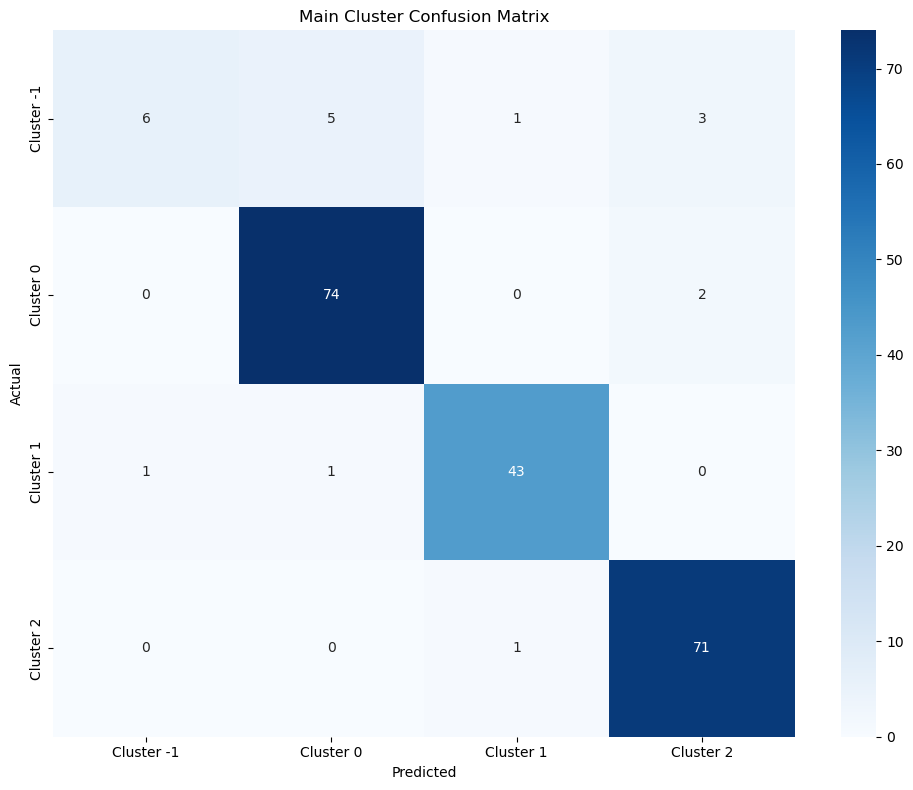


Training subcluster classifiers...

Subcluster Classification Report for Cluster 0:
              precision    recall  f1-score   support

          -1       1.00      0.43      0.60         7
           0       0.83      1.00      0.91         5
           1       0.89      1.00      0.94         8
           2       0.96      1.00      0.98        55

    accuracy                           0.95        75
   macro avg       0.92      0.86      0.86        75
weighted avg       0.95      0.95      0.94        75

Trained subcluster classifier for main cluster 0

Subcluster Classification Report for Cluster 1:
              precision    recall  f1-score   support

          -1       0.75      0.67      0.71         9
           0       0.67      0.80      0.73         5
           1       0.78      0.88      0.82         8
           2       1.00      0.87      0.93        15
           3       0.86      1.00      0.92         6
           4       1.00      1.00      1.00         9

  

In [58]:
# Initialize the classifier
classifier = DrosophilaFlightClassifier()

# Extract your existing features and cluster labels
# 'all_features' is  DataFrame with features
# and 'labels' contains  existing cluster assignments from HDBSCAN
feature_df = all_features  # feature DataFrame
cluster_labels = labels    #  cluster labels from HDBSCAN

# Create subcluster labels dictionary if you have subclusters
# Format: {cluster_id: {data_idx: subcluster_id, ...}, ...}
subcluster_labels = {
    0: {}, # For cluster 0 subclusters
    1: {}, # For cluster 1 subclusters
    2: {}  # For cluster 2 subclusters
}

# Populate with your subcluster data if available
# For example:
for i, (idx, row) in enumerate(all_features.iterrows()):
    main_cluster = labels[i]
    if main_cluster >= 0:  # Skip noise points (-1)
        # Assuming you have a 'subcluster' column for each main cluster
        if 'subcluster' in row and not pd.isna(row['subcluster']):
            subcluster_labels[main_cluster][i] = int(row['subcluster'])

# Train the classifier with your existing clusters
classifier.train_with_existing_clusters(feature_df, cluster_labels, subcluster_labels)

# Save the trained classifier for future use
classifier.save('drosophila_flight_classifier.joblib')

test_trajectory = all_features.iloc[35].to_dict()  # Using row 42 as an example

# Remove any cluster labels that might be in there
if 'cluster' in test_trajectory:
    del test_trajectory['cluster']
if 'subcluster' in test_trajectory:
    del test_trajectory['subcluster']

# Predict
main_cluster, subcluster = classifier.predict(test_trajectory)
print(f"Sample trajectory belongs to cluster {main_cluster}, subcluster {subcluster}")

In [60]:
test_trajectory = all_features.iloc[35].to_dict()  # Using row 42 as an example

# Remove any cluster labels that might be in there
if 'cluster' in test_trajectory:
    del test_trajectory['cluster']
if 'subcluster' in test_trajectory:
    del test_trajectory['subcluster']

# Predict
main_cluster, subcluster = classifier.predict(test_trajectory)
print(f"Sample trajectory belongs to cluster {main_cluster}, subcluster {subcluster}")

Sample trajectory belongs to cluster 1, subcluster 2


In [30]:
'''Cluster 1: Straight Flight Escape

Angular velocity = -1.73 (nearly zero = minimal turning)
Very stable heading (heading_sd = 0.31)
This represents flies escaping by flying directly away from the stimulus
Most likely triggered when the looming stimulus is directly behind the fly

Cluster 0: Right-Turn Escape

Angular velocity = +19.95 (strong positive = clockwise turning)
High heading variability (heading_sd = 0.93)
Represents flies making a sharp right bank/turn to escape
Typically triggered when the looming stimulus appears on the left side

Cluster 2: Left-Turn Escape

Angular velocity = -23.89 (strong negative = counterclockwise turning)
High heading variability (heading_sd = 0.96)
Represents flies making a sharp left bank/turn to escape
Typically triggered when the looming stimulus appears on the right side
'''



'''After  training deployment: 

1.	Process SLEAP- CSV to extract features (same as training)
2.	Load trained classifier
3.	Predict main_cluster, subcluster per timepoint'''

'Cluster 1: Straight Flight Escape\n\nAngular velocity = -1.73 (nearly zero = minimal turning)\nVery stable heading (heading_sd = 0.31)\nThis represents flies escaping by flying directly away from the stimulus\nMost likely triggered when the looming stimulus is directly behind the fly\n\nCluster 0: Right-Turn Escape\n\nAngular velocity = +19.95 (strong positive = clockwise turning)\nHigh heading variability (heading_sd = 0.93)\nRepresents flies making a sharp right bank/turn to escape\nTypically triggered when the looming stimulus appears on the left side\n\nCluster 2: Left-Turn Escape\n\nAngular velocity = -23.89 (strong negative = counterclockwise turning)\nHigh heading variability (heading_sd = 0.96)\nRepresents flies making a sharp left bank/turn to escape\nTypically triggered when the looming stimulus appears on the right side\n'